 <center> <h1> **Pattern Recognition and Machine Learning (EE2802 - AI2000)** </h1> </center>

**Programming Assignment - 03 : Classification</b>


This programming assignment offers you an opportunity to implement various linear classification models. You'll begin with straightforward algorithms like Least Squares classification, LDA, and FDA. Subsequently, you'll delve into implementing the perceptron algorithm. Lastly, you'll tackle probabilistic approaches for classification. To deepen your understanding of these methods, you'll compare their performance and application scenarios critically.

**Instructions**
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








In [1]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random as rand
import math

#for part 6
import pandas as pd
from scipy.stats import norm, multivariate_normal
import sys


ModuleNotFoundError: No module named 'numpy'

**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.


c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.


d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.





Accuracy with LS:91.0%




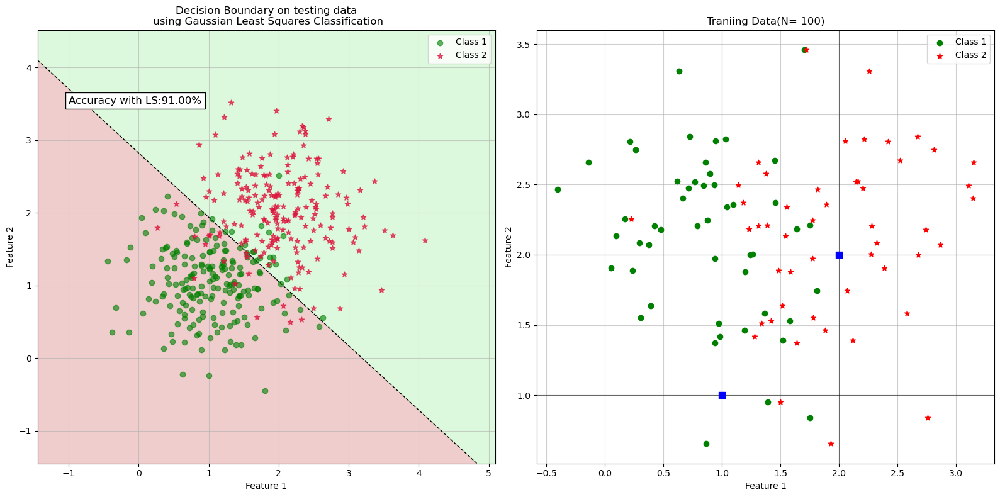


Accuracy with modified LS:91.0%




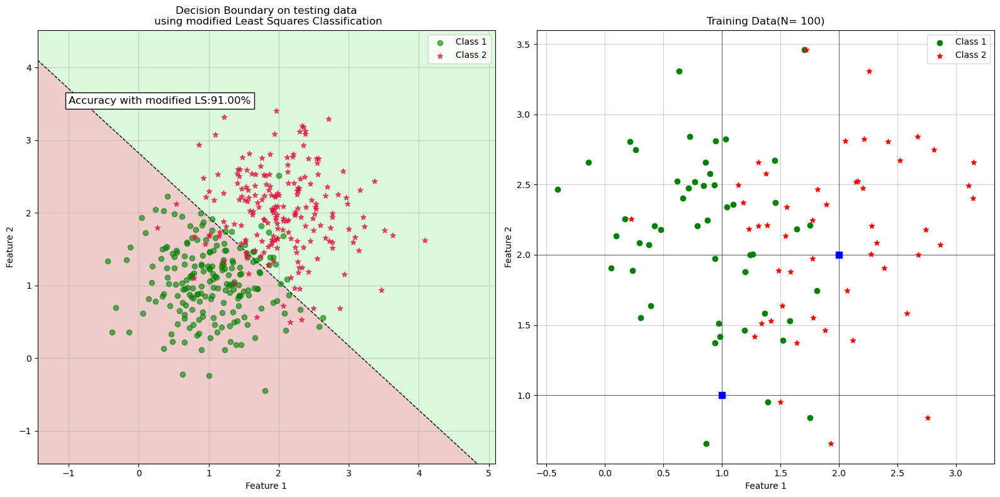


Accuracy with Laplacian LS:84.75%




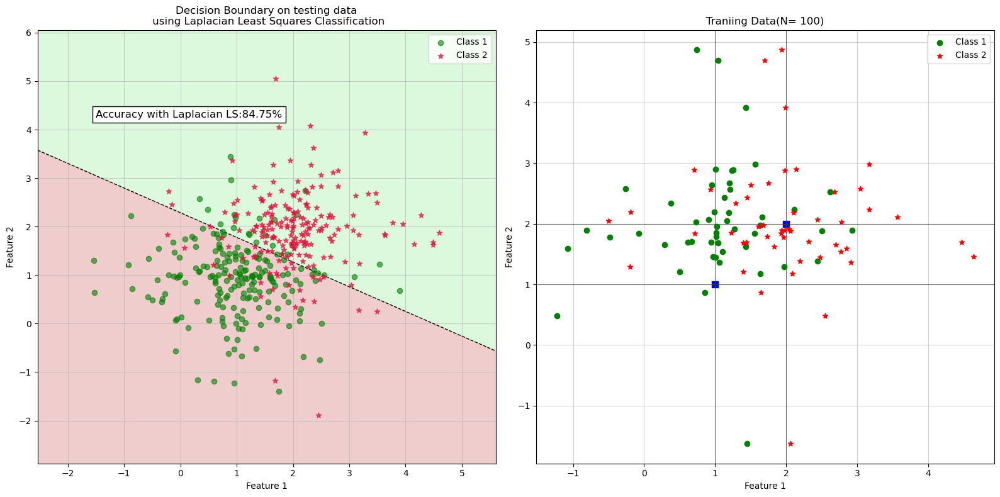

In [ ]:
########################################
#Part-1)-a: Data generation
########################################

#Set the parameters of class distribution
mean1 = np.array([1,1])           #Mean of class1
mean2 = np.array([2,2])           #Mean of class2
cov = np.array([[0.3,0],[0,0.3]]) #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, size = 50) #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, size = 50) #Class2 training data
tr_data =  np.concatenate((class1_tr,class2_tr),axis=0) #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.array([0]*50), np.array([1]*50)), axis=0) #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, size = 200) #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, size = 200) #Class2 testing data
te_data = np.concatenate((class1_te,class2_te),axis=0)  #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.array([0]*200), np.array([1]*200)), axis=0) #Class labels. Assign the value "0" to class1 and the value "1" to class2.

########################################
#Part-1)-b: Find the decision boundary
########################################
#Complete the below function
def LS_Classify(X_train, Y_train, X_test,threshold):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Testing labels

    #Impliment pseudo inverse solution to get the weight vector
    X = np.concatenate((np.ones((X_train.shape[0], 1)), X_train), axis=1)  # Add bias term
    w = np.linalg.solve(X.T @ X, X.T @ Y_train)  # Pseudo-inverse solution

    #Predict the lables of test data using the pseudo inverse solution
    X_test_bias = np.concatenate((np.ones((X_test.shape[0], 1)), X_test), axis=1)  # Add bias term to test data
    """
      finding the threshold for classification is a task to be done.. empirically
    """
    """
      the inequality checks and return true or false interpretted as 1/0 respectively
    """
    predictions = (X_test_bias @ w >= threshold ).astype(int)  # Apply threshold(here it is 0.5) for classification

    #Return the predicted test labels
    return predictions, w

#Get the test data predictions

# thresholds = np.arange(0, 1.005, 0.005)
# for threshold in thresholds:
predictions, w_LS_classify = LS_Classify(tr_data, tr_targets, te_data, threshold = 0.5)

##########################################
#Part-1)-c: Evaluate the quality of decision boundary
##########################################
#Complete the below function
def LS_Classify_Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy

    #Compute the accuracy
    accuracy = np.mean(Y_test == Y_pred)
    #accuracy = (np.sum(Y_test == Y_pred))/len(Y_test)

    #Return the accuracy
    return (100*accuracy)


accuracy = LS_Classify_Accuracy(te_targets, predictions)
print(f'\nAccuracy with LS:{accuracy}%\n\n')

##########################################
#Part-1)-d: Visualize the decision boundary
##########################################

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[1].scatter(class1_tr[:,0],class2_tr[:,1],color='green', label ='Class 1', zorder = 7)
axes[1].axvline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 2)
axes[1].axhline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 3)
axes[1].scatter(class2_tr[:,0],class2_tr[:,1], marker = '*', color='red', label ='Class 2', zorder = 8)
axes[1].axvline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 4)
axes[1].axhline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 5)
axes[1].scatter([1,2],[1,2],color="blue",marker = 's', s= 50, zorder = 6)
axes[1].set_title('Traniing Data(N= 100)')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].grid(axis='both', alpha = 0.6, zorder = 1)
axes[1].legend()

# Generate a mesh grid for visualization
x_min, x_max = te_data[:, 0].min() - 1, te_data[:, 0].max() + 1
y_min, y_max = te_data[:, 1].min() - 1, te_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# decision boundary
X_grid = np.c_[xx.ravel(), yy.ravel()]
X_grid_bias = np.concatenate((np.ones((X_grid.shape[0], 1)), X_grid), axis=1)  # Add bias term
Z = X_grid_bias @ w_LS_classify
Z = Z.reshape(xx.shape)

axes[0].contourf(xx, yy, Z, levels=[-np.inf, 0.5, np.inf], colors=['indianred','lightgreen'], alpha=0.3, zorder = 1)
axes[0].contour(xx, yy, Z, levels=[-np.inf, 0.5, np.inf], colors="black",linestyles = '--', linewidths=1, zorder = 2)
axes[0].scatter(class1_te[:, 0], class1_te[:, 1], alpha = 0.6,color='green', label='Class 1', zorder = 4)
axes[0].scatter(class2_te[:, 0], class2_te[:, 1],alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2', zorder = 5)
axes[0].set_title('Decision Boundary on testing data\n using Gaussian Least Squares Classification')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].text(-1, 3.5, f'Accuracy with LS:{accuracy :.2f}%',fontsize=12, bbox=dict(facecolor='white', alpha=1.0), zorder = 6)
axes[0].legend()
axes[0].grid(alpha=0.6, zorder = 3)

plt.tight_layout()
plt.show()

##########################################
#Part-1)-e: Change the target label notation, and repeat the experiments
##########################################

modified_tr_targets = np.concatenate((np.array([-1]*50), np.array([1]*50)), axis=0) #Class labels. Assign the value "-1" to class1 and the value "1" to class2.
modified_te_targets = np.concatenate((np.array([-1]*200), np.array([1]*200)), axis=0) #Class labels. Assign the value "-1" to class1 and the value "1" to class2.
modified_predictions, modified_w_LS_classify = LS_Classify(tr_data, modified_tr_targets, te_data, threshold=0)

modified_predictions =[-1 if i == 0 else 1 for i in modified_predictions] #Convert the predicted labels to -1 and 1 (instead of 0 and 1)

modified_accuracy = LS_Classify_Accuracy(modified_te_targets, modified_predictions)
print(f'\nAccuracy with modified LS:{modified_accuracy}%\n\n')

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[1].scatter(class1_tr[:,0],class2_tr[:,1],color='green', label ='Class 1', zorder = 7)
axes[1].axvline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 2)
axes[1].axhline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 3)
axes[1].scatter(class2_tr[:,0],class2_tr[:,1], marker = '*', color='red', label ='Class 2', zorder = 8)
axes[1].axvline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 4)
axes[1].axhline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 5)
axes[1].scatter([1,2],[1,2],color="blue",marker = 's', s= 50, zorder = 6)
axes[1].set_title('Training Data(N= 100)')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].grid(axis='both', alpha = 0.6, zorder = 1)
axes[1].legend()

# Generate a mesh grid for visualization
x_min, x_max = te_data[:, 0].min() - 1, te_data[:, 0].max() + 1
y_min, y_max = te_data[:, 1].min() - 1, te_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# decision boundary
Z = X_grid_bias @ modified_w_LS_classify
Z = Z.reshape(xx.shape)

axes[0].contourf(xx, yy, Z, levels=[-np.inf, 0, np.inf], colors=['indianred','lightgreen'], alpha=0.3, zorder = 1)
axes[0].contour(xx, yy, Z, levels=[-np.inf, 0, np.inf], colors="black",linestyles = '--', linewidths=1, zorder = 2)
axes[0].scatter(class1_te[:, 0], class1_te[:, 1], alpha = 0.6,color='green', label='Class 1', zorder = 4)
axes[0].scatter(class2_te[:, 0], class2_te[:, 1],alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2', zorder = 5)
axes[0].set_title('Decision Boundary on testing data\n using modified Least Squares Classification')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].text(-1, 3.5, f'Accuracy with modified LS:{modified_accuracy:.2f}%',fontsize=12, bbox=dict(facecolor='white', alpha=1.0), zorder = 6)
axes[0].legend()
axes[0].grid(alpha=0.6, zorder = 3)

plt.tight_layout()
plt.show()

##########################################
#Part-1)-f: Repeat the experiments with Laplacial distribution
##########################################

def create_multivariate_laplacian(mean, cov, size):
    """Generates multivariate Laplacian data using NumPy."""
    dim = len(mean) # dimentionality
    standard_laplacian = np.random.laplace(loc=0, scale=1, size=(size, dim)) #standard laplacian random variables
    # Cholesky decomposition for correlation
    L = np.linalg.cholesky(cov)
    # Scale and shift to get the desired distribution
    laplacian_data = mean + standard_laplacian @ L
    return laplacian_data

new_class1_tr = create_multivariate_laplacian(mean1, cov, size = 50) #Class1 training data
new_class2_tr = create_multivariate_laplacian(mean2, cov, size = 50) #Class2 training data
new_tr_data =  np.concatenate((new_class1_tr,class2_tr),axis=0) #Combine class1 training and class2 training data to get total training data

#Generate testing data.
new_class1_te = create_multivariate_laplacian(mean1, cov, size = 200) #Class1 testing data
new_class2_te = create_multivariate_laplacian(mean2, cov, size = 200) #Class2 testing data
new_te_data = np.concatenate((new_class1_te,new_class2_te),axis=0)  #Combine class1 testing and class2 testing data to get total testing data
new_predictions, new_w_LS_classify = LS_Classify(new_tr_data, tr_targets, new_te_data, threshold=0.5)
new_accuracy = LS_Classify_Accuracy(te_targets, new_predictions)
print(f'\nAccuracy with Laplacian LS:{new_accuracy}%\n\n')

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[1].scatter(new_class1_tr[:,0],new_class2_tr[:,1],color='green', label ='Class 1', zorder = 7)
axes[1].axvline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 2)
axes[1].axhline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 3)
axes[1].scatter(new_class2_tr[:,0],new_class2_tr[:,1], marker = '*', color='red', label ='Class 2', zorder = 8)
axes[1].axvline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder = 4)
axes[1].axhline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder= 5)
axes[1].scatter([1,2],[1,2],color="blue",marker = 's', s= 50)
axes[1].set_title('Traniing Data(N= 100)')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].grid(axis='both', alpha = 0.6, zorder = 1)
axes[1].legend()

# Generate a mesh grid for visualization
x_min, x_max = new_te_data[:, 0].min() - 1, new_te_data[:, 0].max() + 1
y_min, y_max = new_te_data[:, 1].min() - 1, new_te_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# decision boundary
X_grid = np.c_[xx.ravel(), yy.ravel()]
X_grid_bias = np.concatenate((np.ones((X_grid.shape[0], 1)), X_grid), axis=1)  # Add bias term
Z = X_grid_bias @ new_w_LS_classify
Z = Z.reshape(xx.shape)

axes[0].contourf(xx, yy, Z, levels=[-np.inf, 0.5, np.inf], colors=['indianred','lightgreen'], alpha=0.3, zorder= 1)
axes[0].contour(xx, yy, Z, levels=[-np.inf, 0.5, np.inf], colors="black",linestyles = '--', linewidths=1, zorder = 2)
axes[0].scatter(new_class1_te[:, 0], new_class1_te[:, 1], alpha = 0.6,color='green', label='Class 1', zorder = 4)
axes[0].scatter(new_class2_te[:, 0], new_class2_te[:, 1],alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2', zorder = 5)
axes[0].set_title('Decision Boundary on testing data\n using Laplacian Least Squares Classification')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].text(-1.5, 4.25, f'Accuracy with Laplacian LS:{new_accuracy:.2f}%',fontsize=12, bbox=dict(facecolor='white', alpha=1.0), zorder = 6)
axes[0].legend()
axes[0].grid(alpha=0.6, zorder = 3)

plt.tight_layout()
plt.show()


**Report your observations**

1. In the first experiment, the gaussian data gives arround $90\%$ accuracy on the testing data with class labes being a binary labels(_threshold_ kept @ $0.5$).

2. In the second experiment, the gaussian data with class labels being $+1$ and $-1$ (_threshold_ kept @ 0) gives same accuracy as that of the first experiment, the only changes that has to be done is, the class labels comming out of the function $LS\_Classify$ gives predictions as 0 (for class 1) & 1 (for class 2) which shall be changed to labels [-1 , 1] accordingly later.

3. In the third experiment, the laplacian data gives arround $80\% \sim 85\%$ accuracy on the testing data for binary lables as used in experiment 1(_threshold_ kept @ $0.5$).





**Part - (2) :  Linear & Fisher Discriminant analysis :** In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


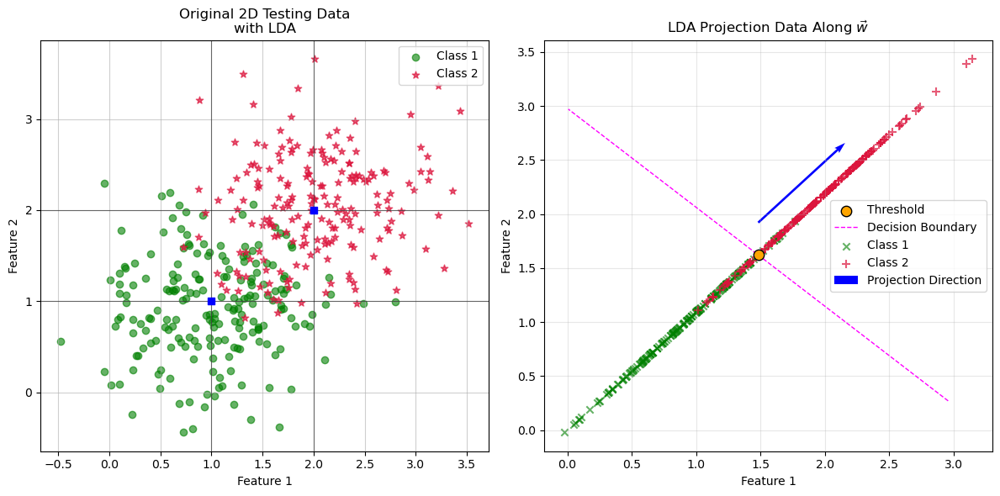


Accuracy with LDA: 90.25%




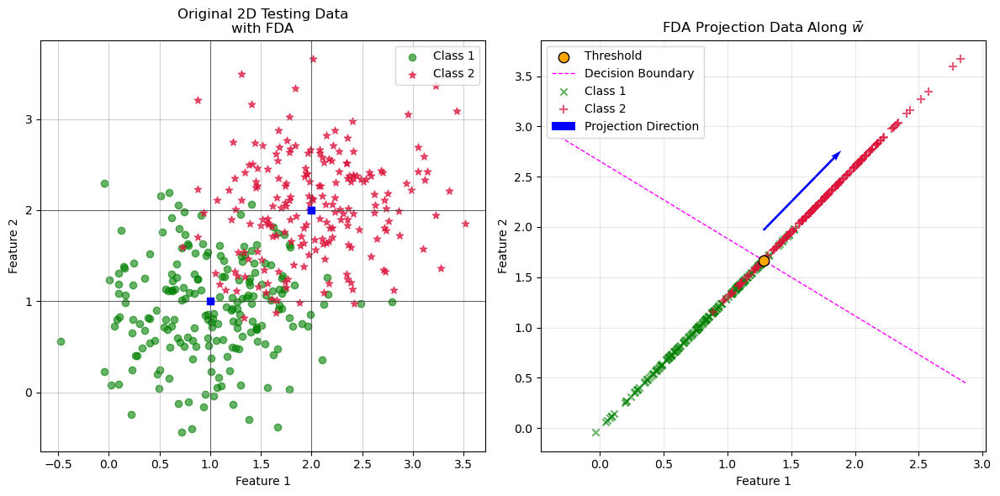


Accuracy with FDA: 90.5%


Projection Matrix : 
 [[-0.56798036]
 [-0.82304211]]


In [ ]:
########################################
#Part-2)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = np.array([1,1])           #Mean of class1
mean2 = np.array([2,2])           #Mean of class2
cov = np.array([[0.3,0],[0,0.3]]) #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, size = 50) #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, size = 50) #Class2 training data
tr_data =  np.concatenate((class1_tr,class2_tr),axis=0) #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.array([0]*50), np.array([1]*50)), axis=0) #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, size = 200) #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, size = 200) #Class2 testing data
te_data = np.concatenate((class1_te,class2_te),axis=0)  #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.array([0]*200), np.array([1]*200)), axis=0) #Class labels. Assign the value "0" to class1 and the value "1" to class2.

########################################
#Part-2)-(b)
########################################
#Complete the below function
def LDA_classify(X_train, Y_train, X_test,):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Between class covariance

  #Compute the weight vector (projection direction)

  #means of each class data...as in class
  m1 = np.mean(X_train[Y_train == 0], axis=0)
  m2 = np.mean(X_train[Y_train == 1], axis=0)
  # print("Mean of class 1:", mean1 ,"\nMean of class 2:", mean2))

  """# Compute the between-class covariance matrix (as meantioned in the outputs)
  mean_diff = (m2 - m1).reshape(-1, 1)
  S_b = np.dot(mean_diff, mean_diff.T) """

  w = (m2 - m1)  # Since we only consider between-class covariance right now
  w = w / np.linalg.norm(w)  #the weight vector to be unit length
  # print("Weight Vector:", w)

  #Compute the threshold  (here it's midpoint for projection)
  threshold = np.dot(w, (m1 + m2) / 2)        #a way of calculation threshold similar to the one in the lecture
  # print("Threshold:", threshold)

  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision
  projections = np.dot(X_test, w)
  predictions = (projections >= threshold).astype(int)

  #Return weight vector and the predictions on testing data
  return predictions, w, threshold

predictions, w, threshold = LDA_classify(tr_data, tr_targets, te_data,)

def LDA_project(w, X_test, Y_test, threshold):
  #Inputs: weight vector, testing data, and testing labels

  #Project the test data onto 1-dimensional space
  projections = np.dot(X_test, w)
  projected_points = np.outer(projections, w)

  threshold_point = threshold * w

  # Compute a perpendicular direction to w
  perpendicular_w = np.array([-w[1], w[0]])
  perp_line = np.array([threshold_point - 2 * perpendicular_w, threshold_point + 2 * perpendicular_w])

  fig, axes = plt.subplots(1, 2, figsize=(12, 6))
  axes[0].scatter(X_test[Y_test == 0, 0], X_test[Y_test == 0, 1], alpha = 0.6,color='green', label='Class 1')
  axes[0].axvline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=2)
  axes[0].axhline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=3)
  axes[0].scatter(X_test[Y_test == 1, 0], X_test[Y_test == 1, 1], alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2')
  axes[0].axvline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=4)
  axes[0].axhline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=5)
  axes[0].scatter([1,2],[1,2],color="blue",marker = 's', s= 30, zorder=6)
  axes[0].set_xlabel('Feature 1')
  axes[0].set_ylabel('Feature 2')
  axes[0].grid(axis='both', alpha = 0.6, zorder=1)
  axes[0].legend()
  axes[0].set_title('Original 2D Testing Data\nwith LDA')

  #Plot the projections

  axes[1].scatter(threshold_point[0], threshold_point[1], color='orange', s=80, edgecolors='black',  label="Threshold", zorder = 5)
  # Draw the perpendicular decision boundary
  axes[1].plot(perp_line[:, 0], perp_line[:, 1], color = 'magenta', linestyle = '--', linewidth=1, label="Decision Boundary")

  axes[1].scatter(projected_points[Y_test == 0, 0], projected_points[Y_test == 0, 1],  alpha = 0.6,color='green', label='Class 1', marker = 'x')
  axes[1].scatter(projected_points[Y_test == 1, 0], projected_points[Y_test == 1, 1],  alpha= 0.7,s= 60, marker='+', color='crimson', label='Class 2')

  # Plot the weight vector direction
  axes[1].quiver(threshold_point[0] , threshold_point[1]+ 0.3, w[0], w[1], angles='xy', scale_units='xy', scale=1,  color='blue', width=0.005, label="Projection Direction")
  axes[1].set_xlabel('Feature 1')
  axes[1].set_ylabel('Feature 2')
  axes[1].set_title('LDA Projection Data Along $\\vec{w}$')
  axes[1].legend()
  axes[1].grid(alpha=0.3)

  plt.tight_layout()
  plt.show()

  return

LDA_project(w, te_data, te_targets, threshold)

#Compute and print the accuracy
acc = np.mean(predictions == te_targets)
print(f"\nAccuracy with LDA: {acc*100}%\n\n")


########################################
#Part-2)-(c)
########################################
def FDA_classify(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Weight vector and predictions

  #Compute the weight vector

  #means of each clas... as done in class
  m1 = np.mean(X_train[Y_train == 0], axis=0)
  m2 = np.mean(X_train[Y_train == 1], axis=0)

  """
  # Compute the between-class covariance matrix (as meantioned in the outputs)
  mean_diff = (m2 - m1).reshape(-1, 1)
  S_b = np.dot(mean_diff, mean_diff.T)
  # this matrix doesn't contribute to the direction of w (as seen in class & the decision boundary is
  # determined by purly w that comes out of it) hence not computing
  """

  # Compute the within-class covariance matrix
  #S_w_normalize = np.cov(X_train[Y_train == 0], rowvar=False) + np.cov(X_train[Y_train == 1], rowvar=False)
  S_w_1 = np.zeros((X_train.shape[1], X_train.shape[1]))
  S_w_2 = np.zeros((X_train.shape[1], X_train.shape[1]))

  S_w_1 += np.sum([np.dot((x_n_c1-m1).reshape(-1, 1), ((x_n_c1-m1).reshape(-1, 1)).T) for x_n_c1 in X_train[Y_train == 0]], axis=0)
  S_w_2 += np.sum([np.dot((x_n_c2-m2).reshape(-1, 1), ((x_n_c2-m2).reshape(-1, 1)).T) for x_n_c2 in X_train[Y_train == 1]], axis=0)

  S_w = S_w_1 + S_w_2
  # Compute the weight vector

  try:
        S_w_inv = np.linalg.inv(S_w)
  except np.linalg.LinAlgError:
        S_w_inv = np.linalg.pinv(S_w)


  w = S_w_inv.dot(mean2 - mean1)
  w = w / np.linalg.norm(w) #the weight vector to be unit length
  """
    using directly S_w_normalize insted of S_w will also result in same w since S_w
    and S_normalize are in same direction(just their magnitude differ) and we are
    making the resultant w into a unit length vector.
  """

  #Compute the threshold
  threshold = np.dot(w, (mean1 + mean2) / 2)

  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision
  projections = np.dot(X_test, w)
  predictions = (projections >= threshold).astype(int)

  #Return weight vector and the predictions on testing data
  return predictions, w, threshold

predictions, w, threshold = FDA_classify(tr_data, tr_targets, te_data)

def FDA_project(w, X_test, Y_test, threshold):
  #Inputs: weight vector, testing data, and testing labels

  #Project the test data onto 1-dimensional space
  projections = np.dot(X_test, w)
  projected_points = np.outer(projections, w)
  threshold_point = threshold * w

  # Compute a perpendicular direction to w
  perpendicular_w = np.array([-w[1], w[0]])
  perp_line = np.array([threshold_point - 2 * perpendicular_w, threshold_point + 2 * perpendicular_w])

  fig, axes = plt.subplots(1, 2, figsize=(12, 6))
  axes[0].scatter(X_test[Y_test == 0, 0], X_test[Y_test == 0, 1], alpha = 0.6,color='green', label='Class 1')
  axes[0].axvline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=2)
  axes[0].axhline(1, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=3)
  axes[0].scatter(X_test[Y_test == 1, 0], X_test[Y_test == 1, 1], alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2')
  axes[0].axvline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=4)
  axes[0].axhline(2, color='black', linewidth=0.8, linestyle='-', alpha=0.5, zorder=5 )
  axes[0].scatter([1,2],[1,2],color="blue",marker = 's', s= 30, zorder = 6)
  axes[0].set_xlabel('Feature 1')
  axes[0].set_ylabel('Feature 2')
  axes[0].grid(axis='both', alpha = 0.6, zorder=1)
  axes[0].legend()
  axes[0].set_title('Original 2D Testing Data\nwith FDA')

  #Plot the projections
  axes[1].scatter(threshold_point[0], threshold_point[1], color='orange', s=80, edgecolors='black',  label="Threshold", zorder = 5)
  # Draw the perpendicular decision boundary
  axes[1].plot(perp_line[:, 0], perp_line[:, 1], color = 'magenta', linestyle = '--', linewidth=1, label="Decision Boundary")

  axes[1].scatter(projected_points[Y_test == 0, 0], projected_points[Y_test == 0, 1],  alpha = 0.6,color='green', label='Class 1', marker = 'x')
  axes[1].scatter(projected_points[Y_test == 1, 0], projected_points[Y_test == 1, 1],  alpha= 0.7,s= 60, marker='+', color='crimson', label='Class 2')

  # Plot the weight vector direction
  axes[1].quiver(threshold_point[0] , threshold_point[1]+ 0.3, w[0], w[1], angles='xy', scale_units='xy', scale=1,  color='blue', width=0.005, label="Projection Direction")
  axes[1].set_xlabel('Feature 1')
  axes[1].set_ylabel('Feature 2')
  axes[1].set_title('FDA Projection Data Along $\\vec{w}$')
  axes[1].legend()
  axes[1].grid(alpha=0.3)

  plt.tight_layout()
  plt.show()

  return

FDA_project(w, te_data, te_targets, threshold)

#Compute and print the accuracy
acc = np.mean(predictions == te_targets)
print(f"\nAccuracy with FDA: {acc*100}%\n\n")


########################################
#Part-2)-(d)
########################################

def FDA_project_K(X_train, Y_train, X_test, k):
  #Inputs: Training data, Training label, Testing data, and the number of eigen vectors to be considered(number of projection components k)
  #Outputs: Projection matrix (W), and projected test data

  #means of each class... as done in class
  m1 = np.mean(X_train[Y_train == 0], axis=0)
  m2 = np.mean(X_train[Y_train == 1], axis=0)

  # Compute the between-class covariance matrix
  mean_diff = (m2 - m1).reshape(-1, 1)
  S_b = np.dot(mean_diff, mean_diff.T)


  # Compute the within-class covariance matrix
  S_w_1 = np.zeros((X_train.shape[1], X_train.shape[1]))
  S_w_2 = np.zeros((X_train.shape[1], X_train.shape[1]))

  S_w_1 += np.sum([np.dot((x_n_c1-m1).reshape(-1, 1), ((x_n_c1-m1).reshape(-1, 1)).T) for x_n_c1 in X_train[Y_train == 0]], axis=0)
  S_w_2 += np.sum([np.dot((x_n_c2-m2).reshape(-1, 1), ((x_n_c2-m2).reshape(-1, 1)).T) for x_n_c2 in X_train[Y_train == 1]], axis=0)

  S_w = S_w_1 + S_w_2

  """
    assuming that the data is binary classification, else, we need to get unique class labels for each class,
    and then compute the within class covariance matrix for each class and sum them up to get S_w
  """

  try:
        S_w_inv = np.linalg.inv(S_w)
  except np.linalg.LinAlgError:
        S_w_inv = np.linalg.pinv(S_w)

    # Solve the generalized eigenvalue problem for inv(Sw) * Sb
  eigvals, eigvecs = np.linalg.eig(S_w_inv.dot(S_b))

  # Sort eigenvectors by eigenvalues in descending order
  sorted_indices = np.argsort(-np.abs(eigvals))  # descending order of magnitude
  W = eigvecs[:, sorted_indices[:k]]  # take the top-k eigenvectors

  # Project test data
  projected_test_data = X_test @ W

  #Compute and return the projection matrix

  return W, projected_test_data


W, proj_test = FDA_project_K(tr_data, tr_targets, te_data, k=1)  # k = 1 for 1D
print("Projection Matrix : \n", W)


**Report your observations**

1. In Linear Discriminant Analysis, the projected data got a seperability of arround above $90\%$ .
2. In Fischer Discriminiant Analysis, the projected data is also arround same but LDA always has given above $90\%$, whereas, the FDA is uncertain of crossing $90\%$, it mostly goes arround $85\% - 90\%$ accuracy only

3. A function to project the data from $N$ dimentions(here 2) to $K$ dimensions has been written , but not used because , generally, $N > K$, but here since $N = 2$ and $K = 1$(the only possible case) which has been already done in part c .  
Assuming that the data is binary classification, the $S\_w$ has been calculated as per the class notes. else, we need to get unique class labels for each class, and then compute the within class covariance matrix for each class and sum them up to get $S\_w$.



**Part (3) : Classification using perceptron algorithm**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.


b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. $60\%$ of the data will be used for training, and the remaining $40\%$ will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.
  

e). Report your observations


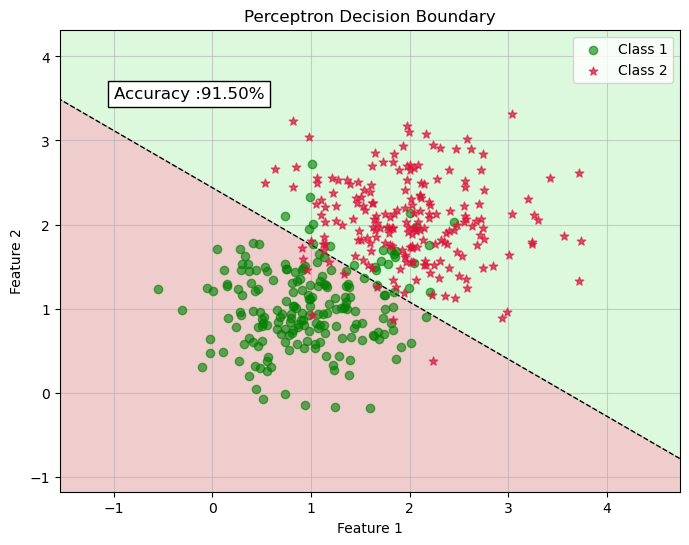

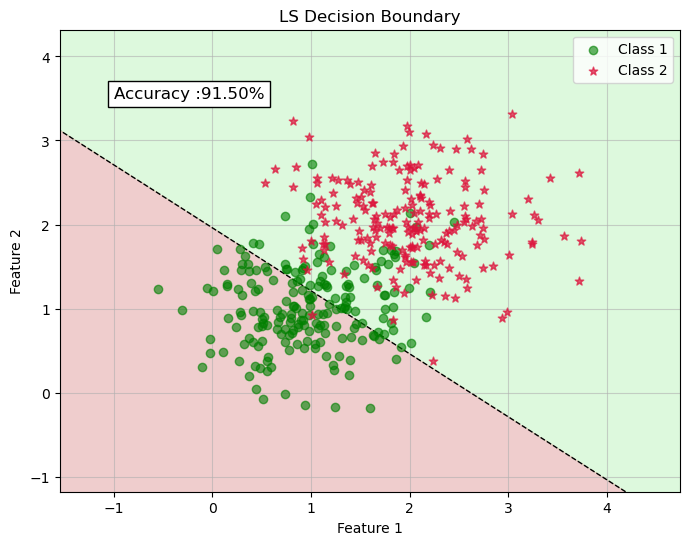

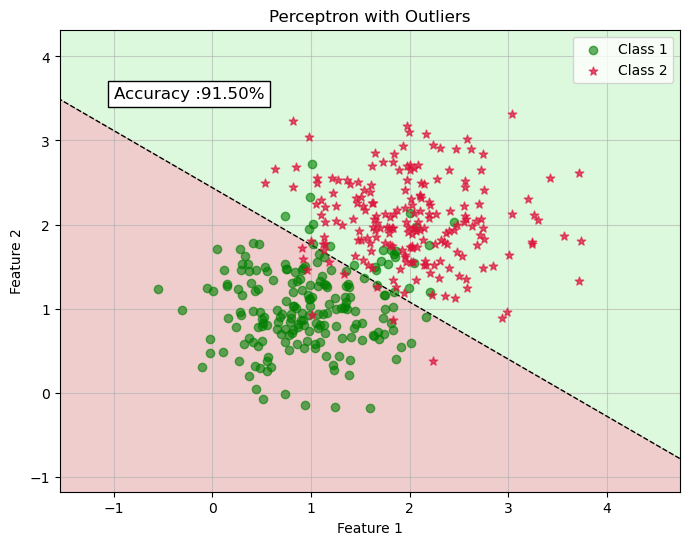

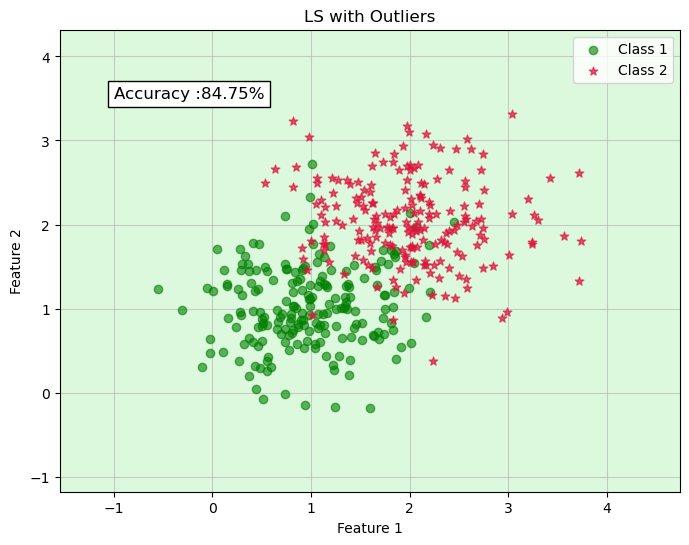

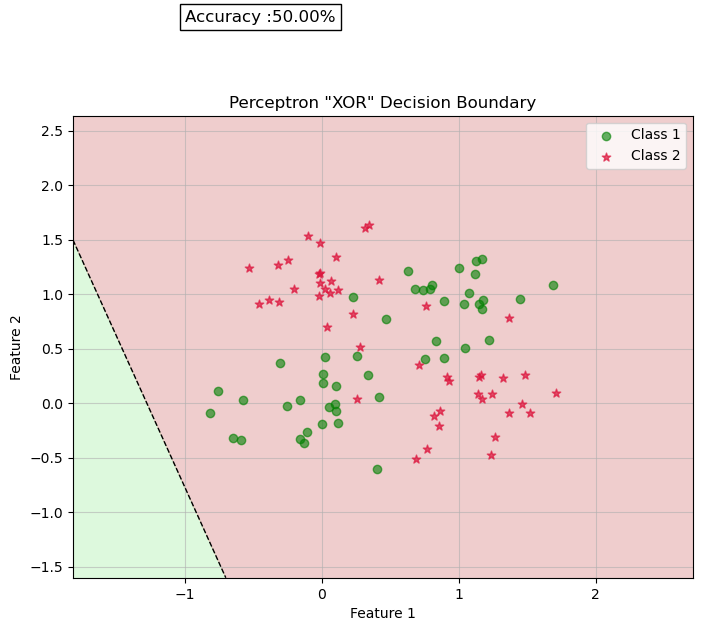

In [ ]:
########################################
#Part-3)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = np.array([1,1])           #Mean of class1
mean2 = np.array([2,2])           #Mean of class2
cov = np.array([[0.3,0],[0,0.3]]) #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, size = 50) #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, size = 50) #Class2 training data
tr_data =  np.concatenate((class1_tr,class2_tr),axis=0) #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.array([1]*50), np.array([-1]*50)), axis=0) #Class labels. Assign the value "1" to class1 and the value "-1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, size = 200) #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, size = 200) #Class2 testing data
te_data = np.concatenate((class1_te,class2_te),axis=0)  #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.array([1]*200), np.array([-1]*200)), axis=0) #Class labels. Assign the value "1" to class1 and the value "-1" to class2.


indices = np.random.permutation(len(tr_data))
# Shuffle both arrays using the same permutation
tr_data = tr_data[indices]
tr_targets = tr_targets[indices]

########################################
#Part-3)-(b)
########################################
def Perceptron(X_train, Y_train, X_test, Y_test):
    #Inputs: Training data, Training labels, Testing data
    #Outputs: Testing data predictions, Weight vector representing the decision boundary

    #lr = 0.01 #leaning rate / step size to be used.. but , in class we used '1' for individual sequential updates

    epochs = 100_000   #Number of epochs
    X_tr = np.hstack((np.ones((X_train.shape[0], 1)), X_train)) #Data. Append ones to the training data to take care of the bias
    X_te = np.hstack((np.ones((X_test.shape[0], 1)), X_test))
    w = np.zeros(X_tr.shape[1]) #Initialize the weight vector

    w_best = w
    best_accuracy = 0.0
    for epoch in range(epochs):
      for i in range(X_tr.shape[0]):
        #Compute the predictions

        #Compute the error
        if (Y_train[i] * np.dot(X_tr[i], w))<= 0:
          #Update the weight vector
          w += 1 * Y_train[i] * X_tr[i]
          predictions = np.sign(np.dot(X_te, w))
          accuracy = 100 * np.mean(predictions == Y_test)

          if accuracy == 100:
            best_accuracy, w_best = accuracy, w
            print(f"Converged after {epoch+1} steps ")
            break

          elif accuracy >= best_accuracy:
            best_accuracy, w_best = accuracy, w

          """
            don't normalize this weight vector because this reduces the value of w_0 which is
            responsible for the position of the decision boundary from the origin.
          """

    w = w_best #using the best weight vector

    #Compute the test data predicitions using the final weight vector
    predictions = np.sign(np.dot(X_te, w))

    #Return the test data predictions and the final weight vector
    return predictions, w

predictions, w = Perceptron(tr_data, tr_targets, te_data, te_targets)
acc_perceptron = 100 *np.mean(predictions == te_targets)

##########################################
#Plot the decision boundary using perceptron
##########################################

def plot_decision_boundary(w, data, labels,accuracy, title):

  x_min, x_max = data[:, 0].min() - 1, data[:, 0].max() + 1
  y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
  xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

  X_grid = np.c_[xx.ravel(), yy.ravel()]
  X_grid_bias = np.concatenate((np.ones((X_grid.shape[0], 1)), X_grid), axis=1)  # Add bias term
  Z = X_grid_bias @ w
  Z = Z.reshape(xx.shape)

  plt.figure(figsize=(8, 6))
  plt.contourf(xx, yy, Z, levels=[-np.inf, 0.5, np.inf], colors=['lightgreen','indianred'], alpha=0.3,zorder = 1)
  plt.contour(xx, yy, Z, levels=[-np.inf, 0.5, np.inf], colors="black",linestyles = '--', linewidths=1, zorder = 2)
  plt.scatter(data[labels == 1][:, 0], data[labels == 1][:, 1], alpha = 0.6,color='green', label='Class 1', zorder = 4)
  plt.scatter(data[labels == -1][:, 0], data[labels == -1][:, 1], alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2', zorder = 5)
  plt.title(title)
  plt.xlabel('Feature 1')
  plt.ylabel('Feature 2')
  plt.text(-1, 3.5, f'Accuracy :{accuracy:.2f}%',fontsize=12, bbox=dict(facecolor='white', alpha=1.0), zorder = 6)
  plt.legend()
  plt.grid(alpha=0.6, zorder = 3)
  plt.show()

  return

plot_decision_boundary(w, te_data, te_targets, acc_perceptron,  'Perceptron Decision Boundary')

##########################################
#Plot the decision boundary using least squares
##########################################

predictions_LS,  w_LS_classify = LS_Classify(tr_data, tr_targets, te_data, threshold = 0)

predictions_LS = [-1 if i == 0 else 1 for i in predictions_LS]  #changing the labels from [0,1] to [1, -1]

acc_LS = LS_Classify_Accuracy(te_targets, predictions_LS)
plot_decision_boundary(w_LS_classify, te_data, te_targets, acc_LS,  'LS Decision Boundary')

##########################################
#Part-3)-(c): Repeat the experiments with the true outliers added to the data. Compare and contrast the perceptron algorithm with least squares method
##########################################
def add_outliers(data, labels):
  outliers = np.array([[20, 20], [15.5, 26.5], [5.5, 17]])
  return np.vstack((data, outliers)), np.hstack((labels, -np.ones(len(outliers))))

tr_data_outliers, tr_targets_outliers = add_outliers(tr_data, tr_targets)

#for perceptron
predictions_outliers, w_outliers = Perceptron(tr_data_outliers, tr_targets_outliers, te_data, te_targets)
acc_perceptron_outliers = 100 *np.mean(predictions_outliers == te_targets)
plot_decision_boundary(w_outliers, te_data, te_targets, acc_perceptron_outliers ,'Perceptron with Outliers')

#for least sqaures
predictions_outliers_LS,  w_LS_classify_outliers = LS_Classify(tr_data_outliers, tr_targets_outliers, te_data, threshold = 0)

predictions_outliers_LS = [-1 if i == 0 else 1 for i in predictions_outliers_LS]  #changing the labels from [0,1] to [1, -1]

acc_LS_outliers = LS_Classify_Accuracy(te_targets, predictions_outliers_LS)
plot_decision_boundary(w_LS_classify_outliers, te_data, te_targets, acc_LS_outliers ,'LS with Outliers')

##########################################
#Part-3)-(d): Data generation XOR
##########################################

#Set the parameters of Gaussian distribution
class1_mean1 = np.array([0, 0]) #Mean of Gaussian1
class1_mean2 = np.array([1, 1]) #Mean of Gaussian3
class2_mean1 = np.array([1, 0]) #Mean of Gaussian2
class2_mean2 = np.array([0, 1]) #Mean of Gaussian4
cov = np.array([[0.1, 0], [0, 0.1]]) #Covariance matrix. Same covariance for class1 and class2

#Generate  data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution

class1_data1 =  np.random.multivariate_normal(class1_mean1, cov, 60)
class1_data2 =  np.random.multivariate_normal(class1_mean2, cov, 60)
class2_data1 =  np.random.multivariate_normal(class2_mean1, cov, 60)
class2_data2 =  np.random.multivariate_normal(class2_mean2, cov, 60)

#Obtain 2-class dataset
rho = 0.6 # traing % of the data

#Create train test splits

#for class 1
train_class1_data1 = class1_data1[:int(rho*len(class1_data1))]
train_class1_data2 = class1_data2[:int(rho*len(class1_data2))]

train_class1 = np.vstack((train_class1_data1, train_class1_data2))
train_class1_labels = np.ones(len(train_class1))

test_class1_data1 = class1_data1[int(rho*len(class1_data1)):]
test_class1_data2 = class1_data2[int(rho*len(class1_data2)):]

test_class1 = np.vstack((test_class1_data1, test_class1_data2))
test_class1_labels = np.ones(len(test_class1))

#for class 2
train_class2_data1 = class2_data1[:int(rho*len(class2_data1))]
train_class2_data2 = class2_data2[:int(rho*len(class2_data2))]

train_class2 = np.vstack((train_class2_data1, train_class2_data2))
train_class2_labels = np.ones(len(train_class2))

test_class2_data1 = class2_data1[int(rho*len(class2_data1)):]
test_class2_data2 = class2_data2[int(rho*len(class2_data2)):]

test_class2 = np.vstack((test_class2_data1, test_class2_data2))
test_class2_labels = -np.ones(len(test_class2))

X_train = np.vstack((train_class1, train_class2))
Y_train = np.concatenate((train_class1_labels, train_class2_labels))
X_test = np.vstack((test_class1, test_class2))
Y_test = np.concatenate((test_class1_labels, test_class2_labels))

#Classify this dataset using perceptron algorithm
predictions, w = Perceptron(X_train, Y_train, X_test, Y_test)
acc_XOR_perceptron = 100 *np.mean(predictions == Y_test)

#Plot the decision boundary
plot_decision_boundary(w, X_test, Y_test, acc_XOR_perceptron,  'Perceptron \"XOR\" Decision Boundary')


**Report your observations**

- The Perceptron algorithm theorithically seperates the binary classes provided **the classes are linearly sepearable** (might even take a large number of iterations, probably even $\infty$). but here, if the graph of the OG data is projected onto the $3D$  space, you could see that there exits an over-lap in the data distribution from from where the data has been sampled.  
Hence a random sample taken from from the two classes have overlaping data points thus making the perceptron algorithm not being able to seperate the points, (on top of that, our _MAX_  number of iterations is limited to the computation capability of machines)

1. Thus the perceptron algorithm gives different levels of accuracy ranging from $60\% \sim 85\%$ (over a total of 100000 iterations), but, at some iteration in the middle, there is a chance that the accuracy could even touch arround $90\% \sim 93\%$ thus, at each iteration, calculating the predictions and it's accuracy and storing the best $\vec{w}$ that gives best accuracy(although this method could lead to increase in computaion to a high extent), leads us to the chance of getting the highest accuracy & linear seperability over all iterations $\tau$.
2. If the theoritical highest accuracy has been reached(which is an obvious $100\%$), the algorithm could stop the rest of the iterations.  
It has been observed **here**, that if the the data is linearly seperable, the number of iterations($\tau$) required is $\le 5$.

3. The LS approach for the same data (of the same target labels used for that of perceptron algo) provides a relatively higher separation btw the classes(arround $\sim 90\%$).  
The only change that has to have been done is that , the target labels should be realigned with that of the predicted labels because $LS\_Classify$ function always returns $0 \& 1$

4. when **true outliers** were added to the data, the perceptron algorithm still gave the same level of separation as that of non-outliers case.  
But the LS approach accuracy reduces which is obvious since it uses minimization of L2 norms for error calculations.

5. As discussed in class, the perceptron algoritm failes to classify the simple $XOR$ problem with an accuracy of always $50\%$


**Part (4) : Understanding the decision boundaries of MAP approach to classification -** Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/\vec{x})$ = $p(c_{2}/\vec{x})$. Where $c_{1}$ and $c_{2}$ are the class indicators and $\vec{x_{n}}/X$ is the data. With proper assumpuptions on prior and likelihood, $p(c/\vec{x})$ follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mathcal{N}(\vec{\mu_{1}},\Sigma_{1}),\mathcal{N}(\vec{\mu_{2}},\Sigma_{2})$, we can derive the decision boundary equation i.e $W$ and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a) Class distributions share the same covariance matrix: Linear decision boundary.**
  1. Let $\vec{\mu_{1}} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\vec{\mu_{2}} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$
  2. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  3. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  4. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  5. Plot the decision boundaries for all the three cases in three different subplots.


**b) Class distributions have different covariance matrices: Non-linear decision boundary.**
  1. Let $\vec{\mu_{1}} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\vec{\mu_{2}} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$
  2. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  3. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  4. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  5. Plot the decision boundaries for all the three cases in three different subplots.


**c) Report your observations**

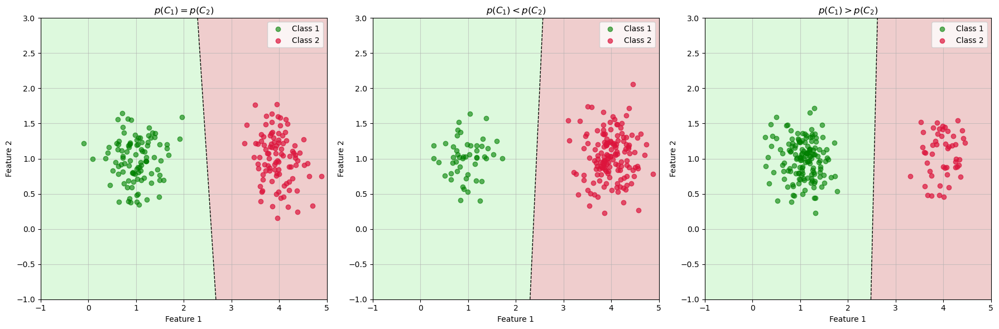

In [ ]:
##########################################
#Part-4a)-1: Data Generation
##########################################
m1 = np.array([1, 1])
m2 = np.array([4, 1])
cov = np.array([[0.1 , 0.0], [0.0, 0.1]])

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
def case1_generate_data(m1, m2, cov1, cov2):
  data_class1 = np.random.multivariate_normal(m1, cov1, 100)
  data_class2 = np.random.multivariate_normal(m2, cov2, 100)
  return data_class1, data_class2

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
def case2_generate_data(m1, m2, cov1, cov2):
  data_class1 = np.random.multivariate_normal(m1, cov1, 50)
  data_class2 = np.random.multivariate_normal(m2, cov2, 150)
  return data_class1, data_class2

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
def case3_generate_data(m1, m2, cov1, cov2):
  data_class1 = np.random.multivariate_normal(m1, cov1, 150)
  data_class2 = np.random.multivariate_normal(m2, cov2, 50)
  return data_class1, data_class2


##########################################
#Part-4a)-5: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train, X_test = None):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = len(X_train[Y_train == 1]) / len(X_train)
    p_c2 = 1.0 - p_c1

    mean_1 = np.mean(X_train[Y_train == 1], axis=0)
    mean_2 = np.mean(X_train[Y_train == 0], axis=0)
    #print(mean_1, mean_2)

    cov1 = np.cov(X_train[Y_train == 1], rowvar=False)
    cov2 = np.cov(X_train[Y_train == 0], rowvar=False)

    cov = p_c2*cov1 + p_c1*cov2

    try:
        cov_inv = np.linalg.inv(cov)
    except np.linalg.LinAlgError:
        cov_inv = np.linalg.pinv(cov)

    w = cov_inv @ (mean_1 - mean_2)
    w0 = -0.5 * (mean_1.T @ cov_inv @ mean_1) + 0.5 *( mean_2.T @ cov_inv @ mean_2)  + np.log(p_c1/p_c2)

    """ccd1 = multivariate_normal(mean_1, cov).pdf(X_test)
    ccd2 = multivariate_normal(mean_2, cov).pdf(X_test)

    pos1 = ccd1 * p_c1
    pos2 = ccd2 * p_c2"""

    #return (pos1 - pos2) #np.log(pos1) - np.log(pos2)
    return np.array([w0]+list(w))


xx, yy = np.meshgrid(np.linspace(-1, 5, 500), np.linspace(-1, 3, 500))

X_grid = np.c_[xx.ravel(), yy.ravel()]
X_grid_bias = np.concatenate((np.ones((X_grid.shape[0], 1)), X_grid), axis=1)  # Add bias term

class1_case1, class2_case1 = case1_generate_data(m1, m2, cov, cov)
decision_boundary_case1 = decisionBoundary(np.vstack((class1_case1, class2_case1)),
                              np.concatenate((np.ones(100), np.zeros(100))))

class1_case2, class2_case2 = case2_generate_data(m1, m2, cov, cov)
decision_boundary_case2 = decisionBoundary(np.vstack((class1_case2, class2_case2)),
                              np.concatenate((np.ones(50), np.zeros(150))))

class1_case3, class2_case3 = case3_generate_data(m1, m2, cov, cov)
decision_boundary_case3 = decisionBoundary(np.vstack((class1_case3, class2_case3)),
                              np.concatenate((np.ones(150), np.zeros(50))))

data = [(class1_case1, class2_case1), (class1_case2, class2_case2), (class1_case3, class2_case3)]
decision_boundaries = [decision_boundary_case1, decision_boundary_case2, decision_boundary_case3]
titles = ["$p(C_1) = p(C_2)$", "$p(C_1) < p(C_2)$", "$p(C_1) > p(C_2)$"]

#Plot the decision regions
fig, axes = plt.subplots(1, 3, figsize=(18, 6),)# dpi=100)

for i , ax in enumerate(axes):
  class1, class2 = data[i]
  decision_boundary = decision_boundaries[i]
  Z = X_grid_bias @ decision_boundary
  Z = Z.reshape(xx.shape)
  ax.contourf(xx, yy, Z, levels=[-np.inf, 0, np.inf], colors=['indianred','lightgreen'], alpha=0.3, zorder= 1)
  ax.contour(xx, yy, Z, levels=[0], colors="black",linestyles = '--', linewidths=1, zorder = 2)
  ax.scatter(class1[:, 0], class1[:, 1], color="green", alpha=0.6, label="Class 1", zorder = 4)
  ax.scatter(class2[:, 0], class2[:, 1], color="crimson", alpha=0.7, label="Class 2", zorder = 5)
  ax.set_title(titles[i])
  ax.set_xlabel("Feature 1")
  ax.set_ylabel("Feature 2")
  ax.legend()
  ax.grid(alpha=0.6, zorder = 3)


plt.tight_layout()
plt.show()


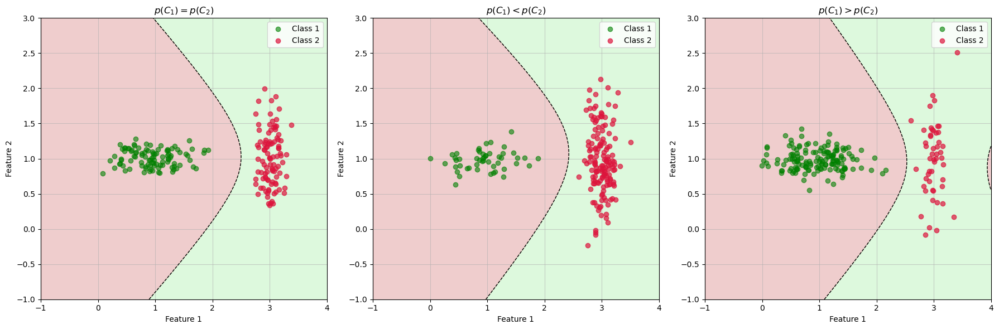

In [ ]:
##########################################
#Part-4b)-1: Data Generation
##########################################
m1 = np.array([1, 1])
m2 = np.array([3, 1])
cov1 = np.array([[0.2 , 0.0], [0.0, 0.02]])
cov2 = np.array([[0.02 , 0.0], [0.0, 0.2]])

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
def case1_generate_data(m1, m2, cov1, cov2):
  data_class1 = np.random.multivariate_normal(m1, cov1, 100)
  data_class2 = np.random.multivariate_normal(m2, cov2, 100)
  return data_class1, data_class2

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
def case2_generate_data(m1, m2, cov1, cov2):
  data_class1 = np.random.multivariate_normal(m1, cov1, 50)
  data_class2 = np.random.multivariate_normal(m2, cov2, 150)
  return data_class1, data_class2

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
def case3_generate_data(m1, m2, cov1, cov2):
  data_class1 = np.random.multivariate_normal(m1, cov1, 150)
  data_class2 = np.random.multivariate_normal(m2, cov2, 50)
  return data_class1, data_class2

##########################################
#Part-4b)-5: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train, X_test):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = len(X_train[Y_train == 1]) / len(X_train)
    p_c2 = 1.0 - p_c1

    mean_1 = np.mean(X_train[Y_train == 1], axis=0)
    mean_2 = np.mean(X_train[Y_train == 0], axis=0)
    #print(mean_1, mean_2)

    cov1 = np.cov(X_train[Y_train == 1], rowvar=False)
    cov2 = np.cov(X_train[Y_train == 0], rowvar=False)

    #Compute predictions on test data
    ccd1 = multivariate_normal(mean_1, cov1).pdf(X_test)
    ccd2 = multivariate_normal(mean_2, cov2).pdf(X_test)

    pos1 = ccd1 * p_c1
    pos2 = ccd2 * p_c2

    return (pos1 - pos2)
    #return np.log(pos1) - np.log(pos2)
    #return predictions

xx, yy = np.meshgrid(np.linspace(-1, 4, 500), np.linspace(-1, 3, 500))
points = np.dstack((xx, yy))
class1_case1, class2_case1 = case1_generate_data(m1, m2, cov1, cov2)
decision_boundary_case1 = decisionBoundary(np.vstack((class1_case1, class2_case1)),
                              np.concatenate((np.ones(100), np.zeros(100))), points)

class1_case2, class2_case2 = case2_generate_data(m1, m2, cov1, cov2)
decision_boundary_case2 = decisionBoundary(np.vstack((class1_case2, class2_case2)),
                              np.concatenate((np.ones(50), np.zeros(150))), points)

class1_case3, class2_case3 = case3_generate_data(m1, m2, cov1, cov2)
decision_boundary_case3 = decisionBoundary(np.vstack((class1_case3, class2_case3)),
                              np.concatenate((np.ones(150), np.zeros(50))), points)

data = [(class1_case1, class2_case1), (class1_case2, class2_case2), (class1_case3, class2_case3)]
decision_boundaries = [decision_boundary_case1, decision_boundary_case2, decision_boundary_case3]
titles = ["$p(C_1) = p(C_2)$", "$p(C_1) < p(C_2)$", "$p(C_1) > p(C_2)$"]

#Plot the decision regions
fig, axes = plt.subplots(1, 3, figsize=(18, 6),)# dpi=100)

for i , ax in enumerate(axes):
  class1, class2 = data[i]
  decision_boundary = decision_boundaries[i]
  ax.contourf(xx, yy, decision_boundary, levels=[-np.inf, 0, np.inf], colors=['lightgreen','indianred'], alpha=0.3, zorder = 1)
  ax.scatter(class1[:, 0], class1[:, 1], color="green", alpha=0.6, label="Class 1", zorder = 4)
  ax.scatter(class2[:, 0], class2[:, 1], color="crimson", alpha=0.7, label="Class 2", zorder = 5)
  ax.contour(xx, yy, decision_boundary, levels=[0], colors="black",linestyles = '--', linewidths=1, zorder = 2)
  ax.set_title(titles[i])
  ax.set_xlabel("Feature 1")
  ax.set_ylabel("Feature 2")
  ax.legend()
  ax.grid(alpha=0.6, zorder = 3)


plt.tight_layout()
plt.show()


**Report your observations**

1. Part 4 - a
  - The MAP estimate provides a linear seperability btw the two classes depending on the positions of the points from the classes
  - since $\vec{\mu_{1}} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\vec{\mu_{2}} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$,$\Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$

  - $p(C_1) = p(C_2)$
    - since both classes have saem number of points and the position of the points is uncertain.
    - thus the seperating boundary is linear but the slope is uncertain.  
  - $p(C_1) < p(C_2)$  
    - since class 2 has more number of points , and the line joining the means of the population is horizontal.
    - thus, the direction of the linear seperating hyperplane is away(in the sense of _**tilting**_ ) from the group of points having a bulk density on the data-space
  - $p(C_1) > p(C_2)$
    - this case is same as that of the above.
    - the only change here occurs is that, class 1 has more points than class 2.

2. Part 4 - b  
  - The MAP estimate provides a quadratic seperability btw the two classes beacause the variance of the class 1 data is high (relativily) in $Feature \space 1$ direction and for class 2 it is more in $Feature \space 2$ direction.
  - since $\vec{\mu_{1}} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\vec{\mu_{2}} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$,$\Sigma_{1} =  \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, $\Sigma_{2} =  \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$

  - $p(C_1) = p(C_2)$
    - since both classes have same number of points, the quadratic curve has it's tip along the line(roughly) joining the means of both classes.
    - the decision region almost looks like a hyperbolic curve for class 2 points(the curve might not be visible due to scalling of the graph co-ordinates, but it's there.)
  - $p(C_1) < p(C_2)$  
    - since class 2 has more points than that of class 1, the quadratic curve has it's tip along the line(roughly) joining the means of both classes,  
    but the width of the curve is low because it has to give more space to  points of the class 2  
    - the decision region still looks like a hyperbolic curve for class 2 points.
  - $p(C_1) > p(C_2)$
    - since class 1 has more points than that of class 2, the quadratic curve has it's tip along the line(roughly) joining the means of both classes,  
    but the width of the curve is more because it has to give more space to  points of the class 1.
    - the decision region still looks like a hyperbolic curve for class 2 points.
  



**Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ):** logistic regression model: $y = \frac{1}{1+e^{-\vec{w}^{T}\vec{x}}}$. With the provided training data, $X\_train$ and $Y\_train$, your task is to identify the optimal $\vec{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\vec{w}$ can be applied to predict outcomes on the test data, $X\_test$.





a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\vec{w}$ using the training data. You can initialize $\vec{w}$ with random values and iteratively update it to determine the optimal $\vec{w}$. Subsequently, this optimal $\vec{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.


f). Report your observations




 Accuracy with Logistic Regression:92.25%




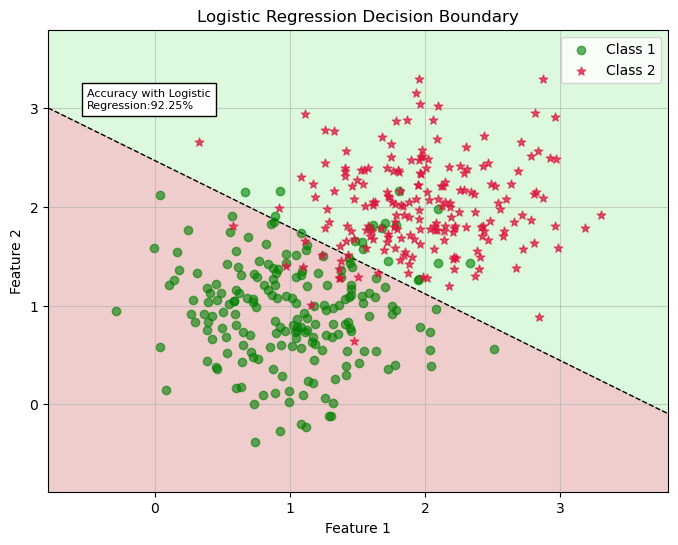



 Accuracy with Least Squares without outliers:92.75%




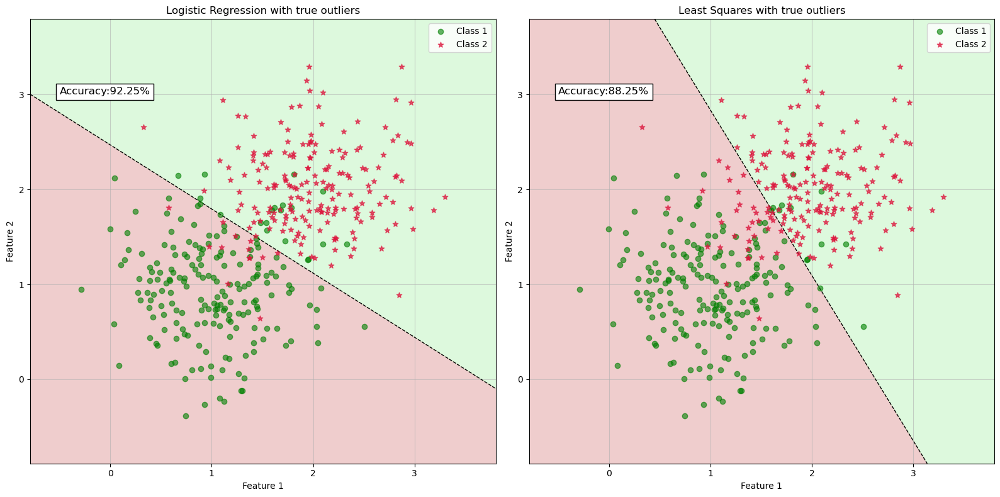

In [ ]:
##################################################
#Part-5)-1: Data generation
##################################################

#Set the parameters of class distribution
mean1 = np.array([1,1])           #Mean of class1
mean2 = np.array([2,2])           #Mean of class2
cov = np.array([[0.3,0],[0,0.3]]) #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, size = 50) #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, size = 50) #Class2 training data
tr_data =  np.concatenate((class1_tr,class2_tr),axis=0) #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.array([0]*50), np.array([1]*50)), axis=0) #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, size = 200) #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, size = 200) #Class2 testing data
te_data = np.concatenate((class1_te,class2_te),axis=0)  #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.array([0]*200), np.array([1]*200)), axis=0) #Class labels. Assign the value "0" to class1 and the value "1" to class2.

##################################################
#Part-5)-b: Complete the below logistic regression function
##################################################

def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def Logistic_Regression(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Predictions on test data

  max_iter = 100_000 #max number of ierations for parameter update
  #threshold chosen empirically
  threshold = 0.5 #threshold for classification
  X_tr = np.hstack((np.ones((X_train.shape[0], 1)), X_train)) #Data. Append ones to the training data to take care of the bias
  X_te = np.hstack((np.ones((X_test.shape[0], 1)), X_test))
  w = np.zeros(X_tr.shape[1]) #Initialize the weight vector

  for _ in range(max_iter):
    preds = sigmoid(X_tr @ w) #Predictions on X. Sigmoid(w^T.x) our y_n in class
    error = preds - Y_train #Difference between preds and Y_train
    grad = X_tr.T @ error

    #Compute the gradients and the appropriate learning rate. We can use Hessian matrix as learning rate
    R = np.diag(preds * (1 - preds))
    H = X_tr.T @ R @ X_tr

    #Update the weight vector
    # if H turns out to be singular, use psuedo inverse
    try:
        delta_w = np.linalg.inv(H) @ grad
    except np.linalg.LinAlgError:
        delta_w = np.linalg.pinv(H) @ grad

    w -= delta_w

    if np.linalg.norm(delta_w) < 1e-5:  #limit to be chose empirically
      #if w reaches a certain range of ceonvergence criteriom,
      # break the loop by reducing number of iterations
      break

  #Test data predictions
  test_preds = sigmoid(X_te@ w)

  #Compare the predictions with 0, to output the decision
  test_preds = (test_preds>= threshold).astype(int)

  #Return the predicted test labels
  return test_preds, w


Y_pred, w_Logistic = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
#Part-5)-c:
###############################################
def LR_Accuracy(Y_test, Y_pred):
  #Inputs: Ground truth and predicted lables of test data
  #Outputs: Accuracy

  #Compute and return the accuracy
  acc = 100*np.mean(Y_test == Y_pred)
  return acc

acc = LR_Accuracy(te_targets, Y_pred)
print(f'\n\n Accuracy with Logistic Regression:{acc:.2f}%\n\n')

##########################################
#Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################

x_min, x_max = te_data[:, 0].min() - 0.5, te_data[:, 0].max() + 0.5
y_min, y_max = te_data[:, 1].min() - 0.5, te_data[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(y_min, y_max, 200))
X_grid = np.c_[np.ones(xx.ravel().shape), xx.ravel(), yy.ravel()]
Z = sigmoid(X_grid @ w_Logistic)
Z = Z.reshape(xx.shape)

plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, levels=[-np.inf, 0.5, np.inf], colors=['indianred','lightgreen'], alpha=0.3, zorder= 1)
plt.contour(xx, yy, Z, levels=[0, 0.5, 1], colors="black",linestyles = '--', linewidths=1, zorder = 2)
plt.scatter(te_data[te_targets == 0][:, 0], te_data[te_targets == 0][:, 1],alpha = 0.6,color='green', label='Class 1', zorder = 4)
plt.scatter(te_data[te_targets == 1][:, 0], te_data[te_targets == 1][:, 1],alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2', zorder = 5)
plt.title("Logistic Regression Decision Boundary")
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.text(-0.5, 3, f'Accuracy with Logistic\nRegression:{acc:.2f}%',fontsize=8, bbox=dict(facecolor='white', alpha=1.0), zorder = 6)
plt.grid(alpha=0.6, zorder = 3)
plt.legend()
plt.show()

predictions , w_ls = LS_Classify(tr_data, tr_targets, te_data, threshold = 0.5)
acc = LS_Classify_Accuracy(te_targets, predictions)
print(f'\n\n Accuracy with Least Squares without outliers:{acc:.2f}%\n\n')

##########################################
#Part-5)-e: Logistic regression for the data with true outliers
##########################################

outliers = np.array([[20, 20], [15.5, 26.5], [5.5, 17]])
tr_data_outliers , tr_targets_outliers  =  np.vstack((tr_data, outliers)), np.hstack((tr_targets, np.ones(len(outliers))))

x_min, x_max = te_data[:, 0].min() - 0.5, te_data[:, 0].max() + 0.5
y_min, y_max = te_data[:, 1].min() - 0.5, te_data[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(y_min, y_max, 200))


fig, axes = plt.subplots(1, 2, figsize=(16, 8))

#for logistic regression
Y_pred_outliers, w_Logistic_outliers = Logistic_Regression(tr_data_outliers, tr_targets_outliers, te_data)
acc_outliers = LR_Accuracy(te_targets, Y_pred_outliers)

X_grid1 = np.c_[np.ones(xx.ravel().shape), xx.ravel(), yy.ravel()]
Z_LR = sigmoid(X_grid1 @ w_Logistic_outliers)
Z_LR = Z_LR.reshape(xx.shape)

axes[0].contourf(xx, yy, Z_LR, levels=[-np.inf, 0.5, np.inf], colors=['indianred','lightgreen'], alpha=0.3, zorder= 1)
axes[0].contour(xx, yy, Z_LR, levels=[0, 0.5, 1], colors="black",linestyles = '--', linewidths=1, zorder = 2)
axes[0].scatter(te_data[te_targets == 0][:, 0], te_data[te_targets == 0][:, 1],alpha = 0.6,color='green', label='Class 1', zorder = 4)
axes[0].scatter(te_data[te_targets == 1][:, 0], te_data[te_targets == 1][:, 1],alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2', zorder = 5)
axes[0].set_title("Logistic Regression with true outliers")
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].text(-0.5, 3, f'Accuracy:{acc_outliers:.2f}%',fontsize=12, bbox=dict(facecolor='white', alpha=1.0), zorder = 6)
axes[0].grid(alpha=0.6, zorder = 3)
axes[0].legend()

#for least squares
predictions_outliers_LS, w_LS_outliers = LS_Classify(tr_data_outliers, tr_targets_outliers, te_data, threshold = 0.5)
acc_outliers = LS_Classify_Accuracy(te_targets, predictions_outliers_LS)

X_grid2 = np.c_[xx.ravel(), yy.ravel()]
X_grid2_bias = np.concatenate((np.ones((X_grid2.shape[0], 1)), X_grid2), axis=1)  # Add bias term
Z_LS = X_grid2_bias @ w_LS_outliers
Z_LS = Z_LS.reshape(xx.shape)

axes[1].contourf(xx, yy, Z_LS, levels=[-np.inf, 0.5, np.inf], colors=['indianred','lightgreen'], alpha=0.3, zorder= 1)
axes[1].contour(xx, yy, Z_LS, levels=[-np.inf, 0.5, np.inf], colors="black",linestyles = '--', linewidths=1, zorder = 2)
axes[1].scatter(te_data[te_targets == 0][:, 0], te_data[te_targets == 0][:, 1],alpha = 0.6,color='green', label='Class 1', zorder = 4)
axes[1].scatter(te_data[te_targets == 1][:, 0], te_data[te_targets == 1][:, 1],alpha= 0.7,s= 40, marker='*', color='crimson', label='Class 2', zorder = 5)
axes[1].set_title("Least Squares with true outliers")
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].text(-0.5, 3, f'Accuracy:{acc_outliers:.2f}%',fontsize=12, bbox=dict(facecolor='white', alpha=1.0), zorder = 6)
axes[1].grid(alpha=0.6, zorder = 3)
axes[1].legend()

plt.tight_layout()
plt.show()


**Report your observations**

1. Logistic regression typically provides $\sim 90\%$ accuracy with a linear seperating hyperplane(a line here).

2. when (true)outliers are added, the logistic regression always correctly classifies them and thus there is no change in accuracy percentage .

3. When the **same** outliers is now classified by _least squares_ approach, the accuracy decreases dractically.  
There is an increase in the Error function due to outliers.



**Part (6) : Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm**


 **a. Generating synthetic data :**  This part describes the steps involved in generating the synthetic data. 


  1. Let us consider the GMM with Bivariate Gaussians   
  - Choose the appropriate means ($\vec{\mu}$), covariances ($\Sigma$), and weights ($\pi$) of Bivariate Gaussian distributions. You may choose the following parameters for this asignment.  
$$ \vec{\pi} = \begin{bmatrix} \pi_{1}  \\ \pi_{2} \end{bmatrix} = \begin{bmatrix} 0.6  \\ 0.4 \end{bmatrix} \;\;\;\; \vec{\mu_{1}} = \begin{bmatrix} -1.0  \\ -1.0 \end{bmatrix} \;\;\;\; \vec{\mu_{2}} = \begin{bmatrix} 1.0  \\ 1.0 \end{bmatrix} \;\;\;\; $$  
$$ \Sigma_{1}^{full} = \begin{bmatrix} 0.15 & 0.1  \\ 0.1 & 0.25 \end{bmatrix} \;\;\;\; \Sigma_{2}^{full} = \begin{bmatrix} 0.3 & -0.25  \\ -0.25 & 0.25 \end{bmatrix}  $$
$$ \Sigma_{1}^{diagonal} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{diagonal} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $$ 
$$ \Sigma_{1}^{spherical} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{spherical} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $$
$\;\;$
  - Pick one Gaussian following the selection probability as  $\pi_{k}$ where $k \in \{1, 2\}$    
  - Sample the data point from the selected Bivariate Gaussian distribution    
  - Repeat the process N times to get the entire data set  
  2.Create the synthetic data set with the number of mixtures as 2.  
  3.Plot the synthetic data set with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM  </h4>  
$\;\;$
 **b. Implementation of Expectation and Maximization (EM) algorithm :** This part focuses on implementing the EM algorithm from scratch to estimate the parameters of the Gaussian Mixture Model (GMM).   

  1. Chose the number of mixtures (M) and initialize the parameters of GMM model  
  - Make sure that the diagonal elements of covariance are positive, and the weights of Gaussians are positive and sum to 1 for satisfying the axioms of probability.  
$\;\;$
   2. Expectation step :  Evaluate the responsibility of Gaussians in generating the data points using the current estimated parameters i.e $\hat{\vec{\mu}_{k}}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$, here k indicates the Gaussian in GMM  
$$\gamma_{nk} = \frac{\pi_{k} \mathcal{N} ( \vec{x}_{n} / \vec{\mu_{k}} , \Sigma_{k} )}{ \sum_{m=1}^{M} \pi_{m} \mathcal{N} ( \vec{x}_{n} / \vec{\mu_{m}} , \Sigma_{m} ) }    \;\;\;\;\;\; ∀ \;\;k=1,2,...,M \;\; and \;\; n=1,2,...,N$$

   Where N is the total number of data points and M is the total number of Gaussians in GMM   

   - $\gamma_{nk}$ represents the responsibility of $k^{th}$ Gaussian in generating the $n^{th}$ data point   

   - $\sum_{n=1}^{N}$ $\gamma_{nk}$ represents the the effective number of data points generated by $k^{th}$ Gaussian   
$\;\;$

   3. Maximization step :  Update the parameters ($\hat{\vec{\mu}_{k}}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$) of GMM using the current resosibilities ($\gamma_{nk}$) by maximizing the likelihood. 


 - Effective number of data points generated by $k^{th}$ Gaussian : $N_{k}$ = $\sum_{n=1}^{N}$ $\gamma_{nk}$   
 


 - Mean of $k^{th}$ Gaussian : $\hat{\vec{\mu}_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N}\gamma_{nk} \vec{x}_{n}$      
 


 - Covariance of $k^{th}$ Gaussian : $\hat{\Sigma_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} ( \vec{x}_{n} - \hat{\vec{\mu}_{k}} )( \vec{x}_{n} - \hat{\vec{\mu}_{k}} )^{T}$    
 


 - Weight of $k^{th}$ Gaussian : $\hat{\pi_{k}} = \frac{N_{k}}{N}$  
 
$\;\;$
  4. Compute the log-likelihood with the updated parameters  
   5. Repeat the expectation and maximization steps untill convergence  
$\;\;$
  **c. Illustration of EM iterations**  

   1. Plot the contours of the estimated distributions over the iterations in the EM algorithm and overlay the data points.  

$\;\;$

  **d. Understanding the issues with EM algorithm**  
   1. Check the influence of initialization on the convergence of the EM algorithm and fit quality.  
   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section    
   2. Check the influence of the type of covariance matrix on the convergence of the EM algorithm and fit quality . 
   - Execute the EM algorithm with different covariance matrices i.e Spherical, Diagonal and Full covariance  
   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section  


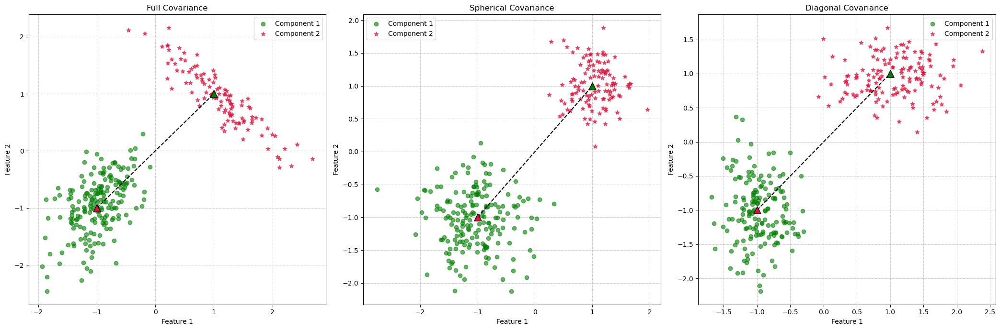

In [ ]:
##########################################
#Part-6)-a: Generating synthetic data
##########################################

def generateData(pi, mu, sigma, N):
    ############################################################################
    #pi = weights of Gaussians, mu = mean of Gaussians, sigma = convariance of Gaussians, N = number of data points
    #Steps
    #1.Select th Gaussian following the probability distribution as pi
    #2.Sample the data points from the selected Gaussian
    #3.Repeat the process N times to get N data points
    #4.Return the sampled data
    ############################################################################
    #You may look into "random.choices" and "np.random.multivariate_normal" functions

    data = []
    labels = []
    for _ in range(N):
        #Select the Gaussian
        k= rand.choices(range(len(pi)), pi)[0]
        #Sample the data points from the selected Gaussian
        point = np.random.multivariate_normal(mu[k], sigma[k])
        data.append(point)
        labels.append(k)

    return np.asarray(data), np.asarray(labels)
    ############################################################################


############################################################################
#Chose the appropriate means ($\mu$), covariances ($\Sigma$), and weights
############################################################################
mu1 = np.array([-1.0, -1.0])   #Mean vector of component1 in GMM
sig1 = np.array([[0.15, 0.1], [0.1, 0.25]]) #Full covariance matrix of component1 in GMM
mu2 = np.array([1.0, 1.0])   #Mean vector of component2 in GMM
sig2 = np.array([[0.3, -0.25], [-0.25, 0.25]]) #Full covariance matrix of component2 in GMM
pi = [0.6, 0.4]   #Prior probabilities

n_points = 900 #Number of points being used in TOTAL DATA

# Spherical covariances
sig1_s = np.array([[0.2, 0.0], [0.0, 0.2]])
sig2_s = np.array([[0.1, 0.0], [0.0, 0.1]])
# Diagonal covariances
sig1_d = np.array([[0.1, 0.0], [0.0, 0.2]])
sig2_d = np.array([[0.2, 0.0], [0.0, 0.1]])

############################################################################
#Create the synthetic data set
############################################################################

data_full, labels_full = generateData(pi, [mu1, mu2], [sig1, sig2], 300)
data_sp, labels_sp = generateData(pi, [mu1, mu2], [sig1_s, sig2_s], 300)
data_dg, labels_dg = generateData(pi, [mu1, mu2], [sig1_d, sig2_d], 300)

"""the below is the piece of code used to shuffle the data, but there doen't exists the need of this , because the data that we get is already randomly
appended to it, the only use of the below code shall exists if we wanna have more shuffled data despite of the already existing shuffled data"""

# indices = np.random.permutation(len(data_full))
# data_full = data_full[indices]
# labels_full= labels_full[indices]

# indices = np.random.permutation(len(data_sp))
# data_sp = data_sp[indices]
# labels_sp= labels_sp[indices]

# indices = np.random.permutation(len(data_dg))
# data_dg = data_dg[indices]
# labels_dg= labels_dg[indices]

############################################################################
#Plot the synthetic data set
############################################################################

data = [(data_full, labels_full), (data_sp, labels_sp), (data_dg, labels_dg)]
titles = ['Full Covariance', 'Spherical Covariance', 'Diagonal Covariance']
fig, axes = plt.subplots(1,3, figsize=(21,7))

#Visualize the data sampled from the GMM with full covariance matrix
#Visualize the data sampled from the GMM with spherical covariance matrix
#Visualize the data sampled from the GMM with diagonal covariance matrix

for i, ax in enumerate(axes):

    data_i, labels_i = data[i]

    ax.scatter(data_i[labels_i ==0, 0], data_i[labels_i==0, 1], alpha = 0.6,color='green', label='Component 1', zorder = 2)
    ax.scatter(data_i[labels_i ==1, 0], data_i[labels_i==1, 1], alpha= 0.7,s= 40, marker='*',color='crimson', label='Component 2', zorder = 3)
    ax.scatter(mu1[0], mu1[1], color='crimson', s=120, edgecolors='black',marker='^', zorder= 5)
    ax.scatter(mu2[0], mu2[1], color='green', s=120, edgecolors='black',marker='^', zorder = 6)
    ax.plot([mu1[0], mu2[0]], [mu1[1], mu2[1]], color = 'black', linestyle = '--', zorder = 4)
    ax.set_title(titles[i])
    ax.grid(axis = 'both', linestyle='-.', linewidth=0.5, zorder = 1)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.legend()

plt.tight_layout()
plt.show()


In [ ]:

#All imports
"""
Have been moved up to the top of the notebook file
"""

##########################################
#Part-6)-b: Implimentation of Expectation-Maximization (EM) algorithm
##########################################

############################################################################
#Write a function to compute the log-likelihood of the data given the parameters
############################################################################
def likelihood(data, pi, mu, sigma, log_likelihood=False, likelihoods=False):
  #Inputs: data, parameters of GMM model
  #Outputs: likelihood
  N , M =  len(data), len(pi)
  log_likely = 0.0
  for n in range(N):
    p = 0.0   #likelihood for nth data point with contributions from all components(gaussians)
    for k in range(M):
      p += pi[k] * multivariate_normal.pdf(data[n], mean=mu[k], cov=sigma[k])

    log_likely += np.log(p)

  return (log_likely if log_likelihood else np.exp(log_likely))

############################################################################
#Write a function for the expectation step
############################################################################
def expectation(data, pi, mu, sigma):
  #Inputs: data, parameters of GMM model
  #Outputs: gamma

  N, M = len(data), len(pi)
  gamma = np.zeros((N, M))
  for n in range(N):
    # for each datapoint x_n in the dataset,
    denominator = sum(pi[k] * multivariate_normal.pdf(data[n], mu[k], sigma[k]) for k in range(M))
    for k in range(M):
      #Iterate through each component of the gaussians to get the responsibility of all components wrt to a particular datapoint x_n
      numerator = pi[k] * multivariate_normal.pdf(data[n], mu[k], sigma[k])
      gamma[n,k] = numerator/denominator

  return gamma    # the responsibility matrix

############################################################################
#Write a function for the maximization step.
############################################################################
def maximization(data, gamma):
  #Inputs: data, gamma
  #Outputs: Updated parameters of GMM model

  N, M = gamma.shape[0], gamma.shape[1]
  Nk_all = np.sum(gamma, axis=0)
  pi = Nk_all/N
  mu = np.zeros((M, data.shape[1]))
  sigma = np.zeros((M, data.shape[1], data.shape[1]))
  for k in range(M):
    #Update pi
    """pi[k] = Nk_all[k]/N
    #this update is outside the loop into a single step"""

    #Update mu
    mu[k] = np.sum(gamma[:,k].reshape(-1,1) * data, axis=0)/Nk_all[k]

    #Update sigma
    mean_devia = data - mu[k]

    #sigma[k] = np.dot(gamma[:,k] * mean_devia.T, mean_devia)/np.sum(gamma[:,k])
    sigma[k] = sum(gamma[n, k] * np.outer(mean_devia[n], mean_devia[n]) for n in range(N))/Nk_all[k]

  #Return the parameters of GMM model
  return pi, mu, sigma

"""maximization(data_full, expectation(data_full, pi, [mu1, mu2], [sig1, sig2]))"""

#Complete the below function. It plots the contours

def plot_contours(data, labels, pi, mu, sigma, print_steps, title):
  xx, yy = np.meshgrid(np.linspace(np.min(data[:, 0]) - 1, np.max(data[:, 0]) + 1, 200), np.linspace(np.min(data[:, 1]) - 1, np.max(data[:, 1]) + 1, 200))
  points = np.dstack((xx, yy))

  plt.figure(figsize=(8, 6))

  plt.scatter(data[labels ==0, 0], data[labels==0, 1], alpha = 0.6,color='green', label='Component 1', zorder = 5)
  plt.scatter(data[labels ==1, 0], data[labels==1, 1], alpha= 0.7,s= 40, marker='*',color='crimson', label='Component 2', zorder = 4)
  plt.scatter(mu1[0], mu1[1], color='crimson', s=30, edgecolors='black',marker='s', zorder= 8)
  plt.scatter(mu2[0], mu2[1], color='green', s=30, edgecolors='black',marker='s', zorder = 7)
  plt.plot([mu1[0], mu2[0]], [mu1[1], mu2[1]], 'k--', zorder = 6)
  for k in range(len(pi)):
    rv = multivariate_normal(mu[k], sigma[k])
    plt.contour(xx, yy, rv.pdf(points), levels=10, cmap='gist_rainbow_r', alpha=0.9, zorder = 2)
    plt.contourf(xx, yy, rv.pdf(points), levels=10, cmap='BrBG_r', alpha=0.2, zorder = 3)

  plt.grid(axis = 'both', linestyle='-.', linewidth=0.5, zorder = 1)
  plt.text(-2, 2, f"Step {print_steps[0]}/{print_steps[1]}",fontsize=12, bbox=dict(facecolor='white', alpha=1.0),zorder = 9)
  plt.xlabel('Feature 1')
  plt.ylabel('Feature 2')
  plt.legend()
  plt.title(title)
  plt.show()

  return


"""
plot_contours(data_full, labels_full, pi, [mu1, mu2], [sig1, sig2], (5, 10), title = "Initial contours\nwith full covariance matrix")
"""


############################################################################
#Run the expectation and maximzation algorithm to estimate the parameters
############################################################################

def execute_em_algorithm(data, labels, initialization_type = "random", covariance_type = "full", steps = 100):
  data = data    #data to run EM-algorithm
  labels =  labels #labels
  N , D = data.shape        #number of input examples, data dimension
  M = 2        #no.of components in GMM

  #Initialize the prior probabilities
  #Initialize the mean vectors

  if initialization_type.casefold() == "random":
    mu = [data[np.random.choice(range(N),)] for _ in range(M)]
    #pi = [1/M for _ in range(M)]
    pi = np.random.dirichlet(np.ones(M))

  elif initialization_type.casefold() == "fixed":
    pi = [0.6, 0.4]
    mu = [(np.array([-1.0, -1.0])), (np.array([1.0, 1.0]))]

  else:
    raise ValueError(f"Invalid initialization type {initialization_type}. Choose 'random' or 'fixed'.")

  #Initialize the covariance matrices

  if covariance_type.casefold() == "full":
    sigma = [(np.array([[0.15, 0.1], [0.1, 0.25]])), (np.array([[0.3, -0.25], [-0.25, 0.25]]))]

  elif covariance_type.casefold() == "spherical":
    sigma = [(np.array([[0.2, 0.0], [0.0, 0.2]])), (np.array([[0.1, 0.0], [0.0, 0.1]]))]

  elif covariance_type.casefold() == "diagonal":
    sigma = [(np.array([[0.1, 0.0], [0.0, 0.2]])), (np.array([[0.2, 0.0], [0.0, 0.1]]))]

  else:
    raise ValueError(f"Invalid covariance type {covariance_type} Choose 'full', 'spherical' or 'diagonal'.")


  nsteps = steps  #Number of steps to run EM algorithm

  log_likelihoods = [0.0]

  for index in range(nsteps):

    #Compute the likelihood
    ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
    log_likelihoods.append(ll)
    print(f"\n\n{covariance_type.capitalize()} covariance | {initialization_type.capitalize()} Initialization | Step no: {index+1}  | Log-Likelihood value = {ll:.4f}\n\n")

    if log_likelihoods[index-1] == log_likelihoods[index]:
      print("Converged")
      break

    #Plot the contours
    plot_contours(data, labels, pi, mu, sigma, print_steps = (index+1, nsteps), title = f"EM Contours\nwith {initialization_type} initialization and {covariance_type} covariance",)

    #Expectation step
    gamma = expectation(data, pi, mu, sigma)

    #Maximization step
    pi, mu, sigma = maximization(data, gamma)

  del log_likelihoods[0]

  steps_used = len(log_likelihoods)
  plt.figure(figsize=(20, 6))
  plt.plot(range(1, steps_used+1, 1), log_likelihoods, linestyle = ':', zorder = 2)
  plt.scatter(range(1, steps_used+1, 1), log_likelihoods, marker='o', color='violet', s= 40, edgecolors='black', zorder = 3)
  plt.title(f"Log-Likelihood over Steps ({covariance_type} covariance, {initialization_type} initialization)")
  plt.xlabel("Iterations")
  plt.ylabel("Log-Likelihood")
  plt.text(steps_used//2, max(log_likelihoods)//2+min(log_likelihoods)//2, f"Final Log-Likelihood = {log_likelihoods[-1]:.4f},\nconverged after {steps_used} steps", fontsize=12, bbox=dict(facecolor='white', alpha=0.7), zorder = 4)
  plt.grid(axis = 'both', linestyle='-.', linewidth=0.5,zorder = 1)
  plt.show()

  return




Full covariance | Random Initialization | Step no: 1  | Log-Likelihood value = -2470.0892




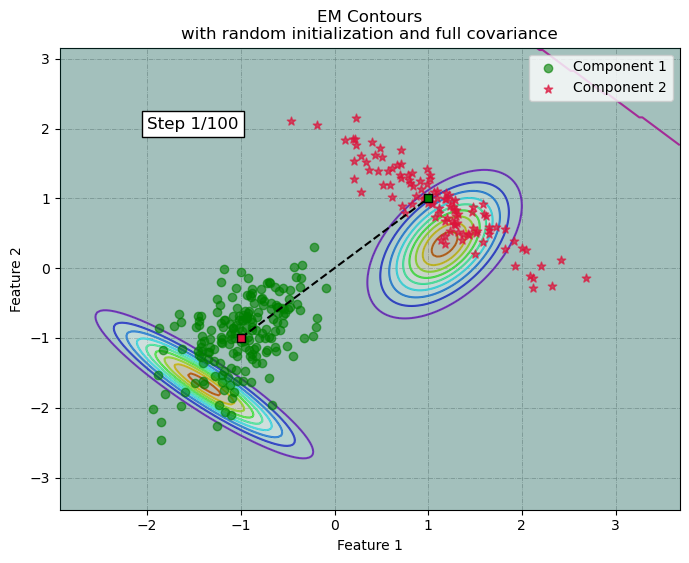



Full covariance | Random Initialization | Step no: 2  | Log-Likelihood value = -699.2605




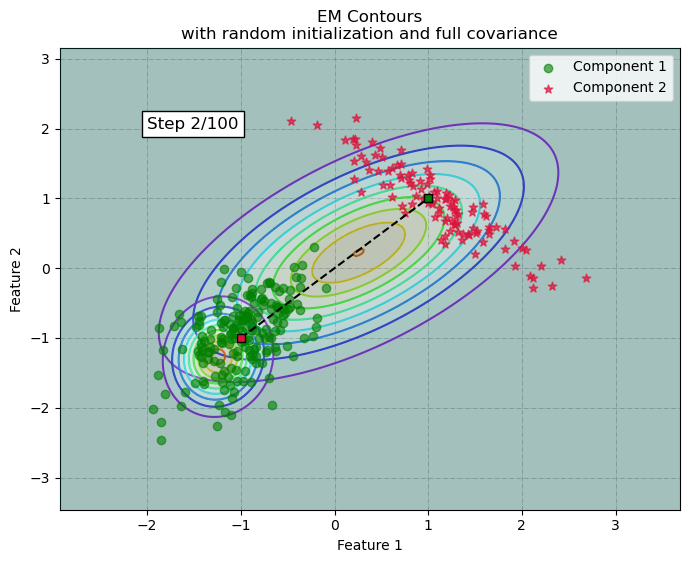



Full covariance | Random Initialization | Step no: 3  | Log-Likelihood value = -668.1971




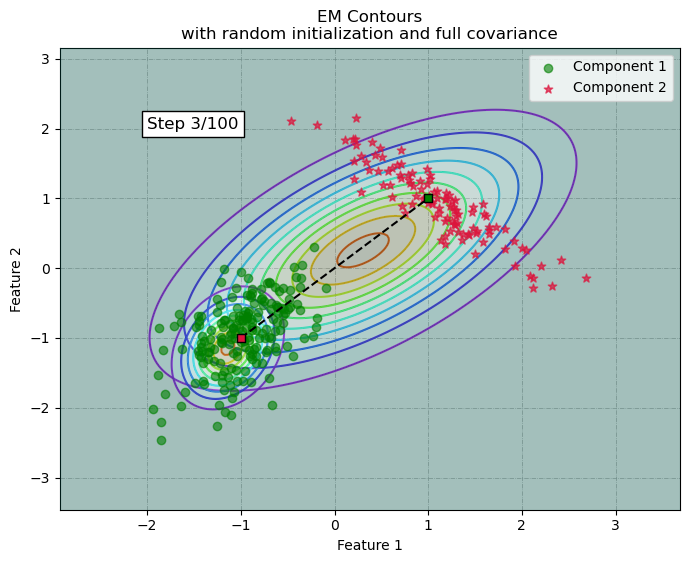



Full covariance | Random Initialization | Step no: 4  | Log-Likelihood value = -648.7494




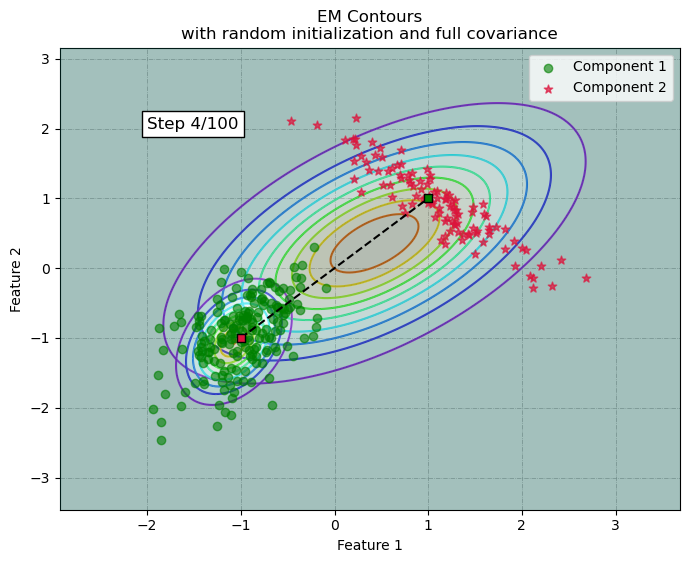



Full covariance | Random Initialization | Step no: 5  | Log-Likelihood value = -634.4201




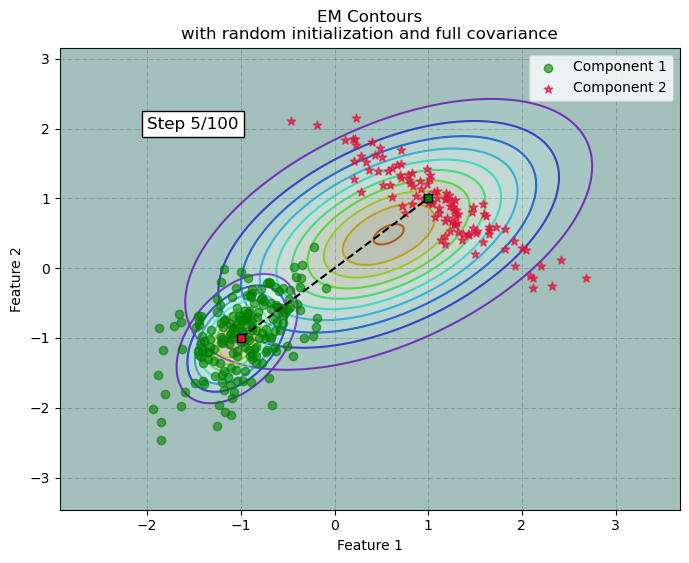



Full covariance | Random Initialization | Step no: 6  | Log-Likelihood value = -615.7621




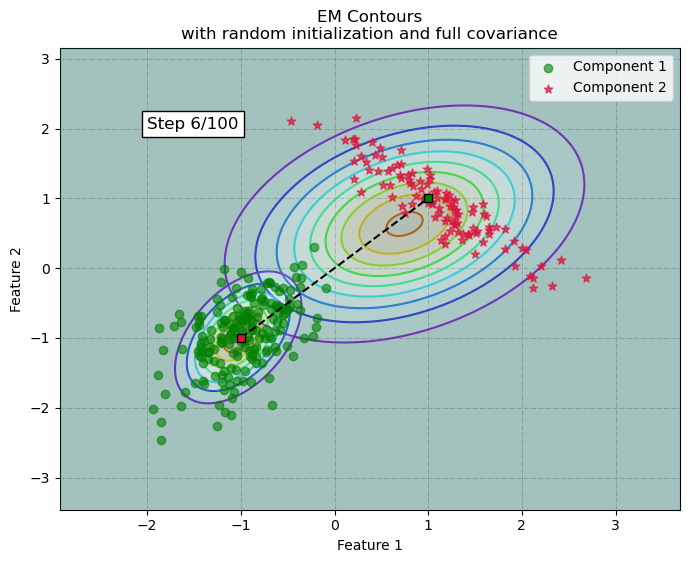



Full covariance | Random Initialization | Step no: 7  | Log-Likelihood value = -578.5213




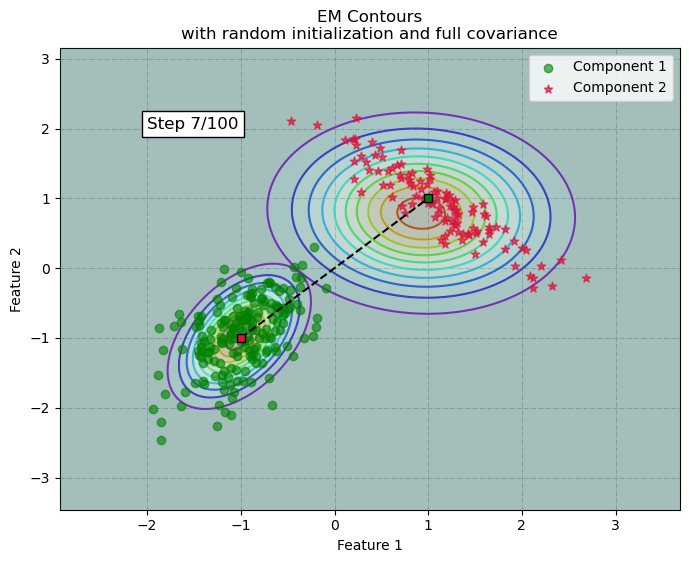



Full covariance | Random Initialization | Step no: 8  | Log-Likelihood value = -499.8628




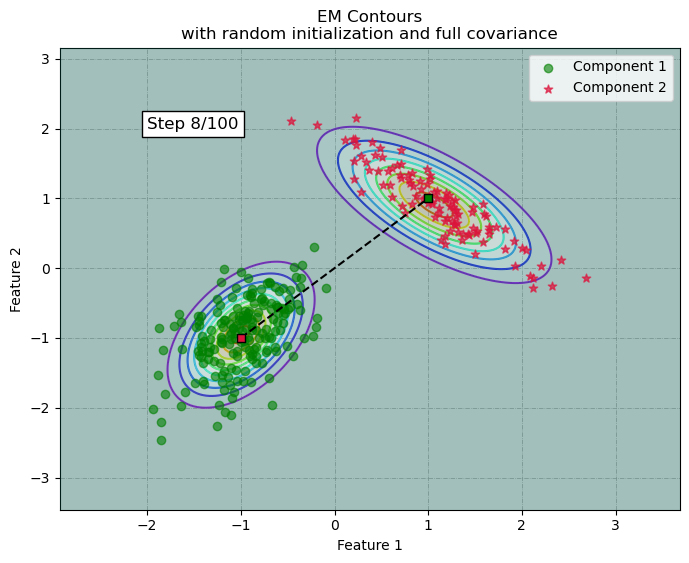



Full covariance | Random Initialization | Step no: 9  | Log-Likelihood value = -465.5789




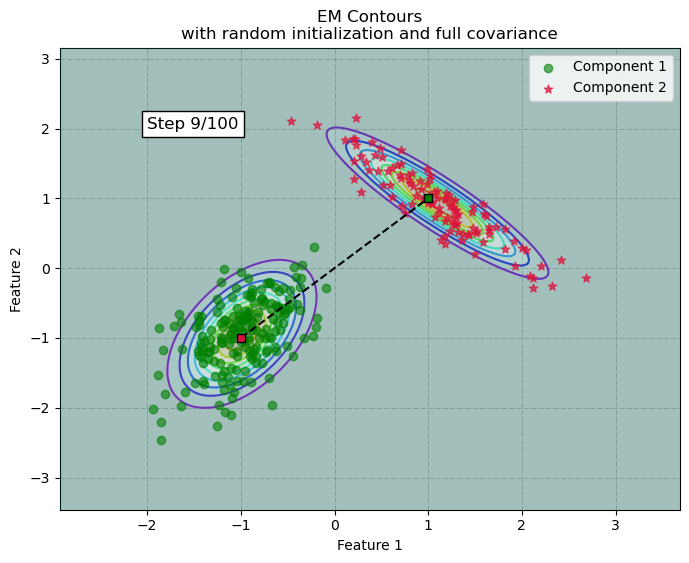



Full covariance | Random Initialization | Step no: 10  | Log-Likelihood value = -465.5787




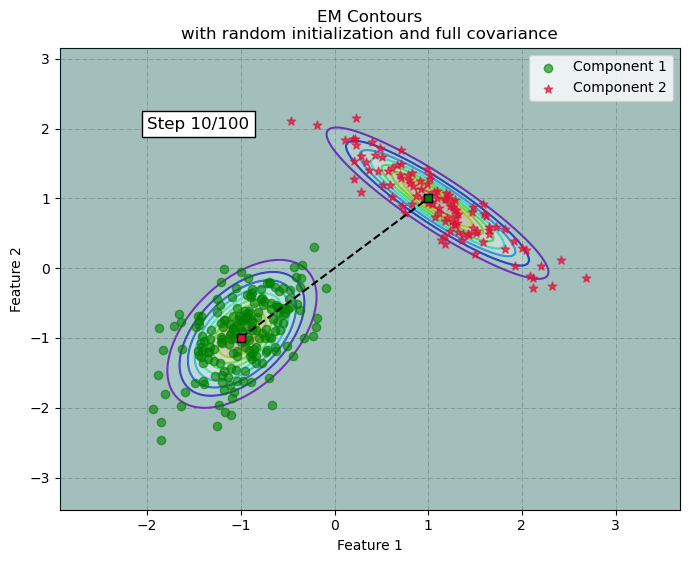



Full covariance | Random Initialization | Step no: 11  | Log-Likelihood value = -465.5787




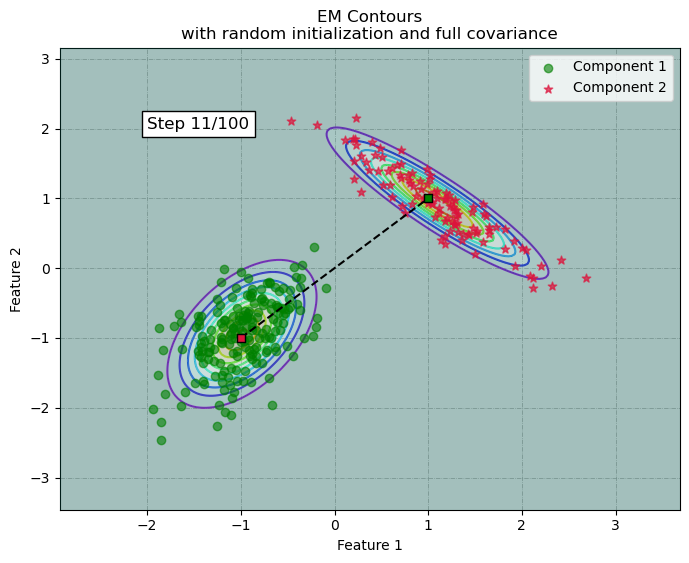



Full covariance | Random Initialization | Step no: 12  | Log-Likelihood value = -465.5787




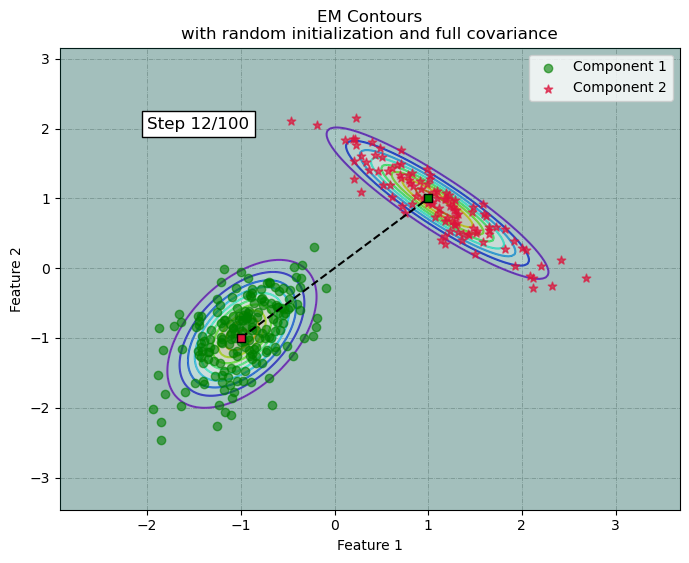



Full covariance | Random Initialization | Step no: 13  | Log-Likelihood value = -465.5787




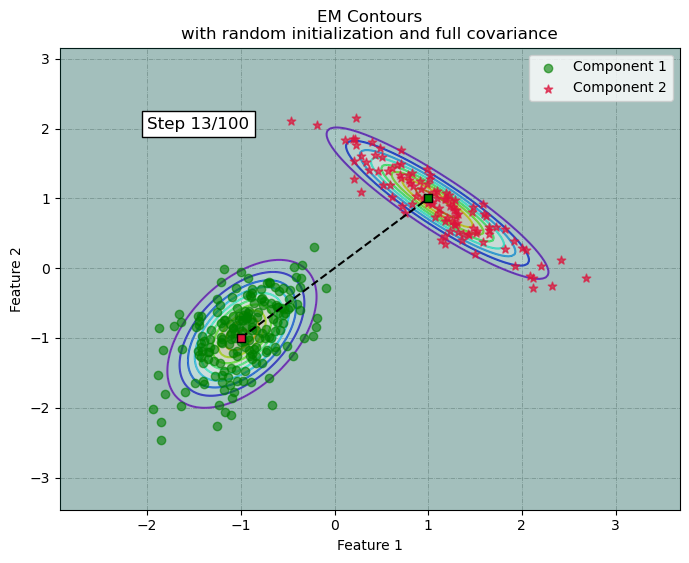



Full covariance | Random Initialization | Step no: 14  | Log-Likelihood value = -465.5787




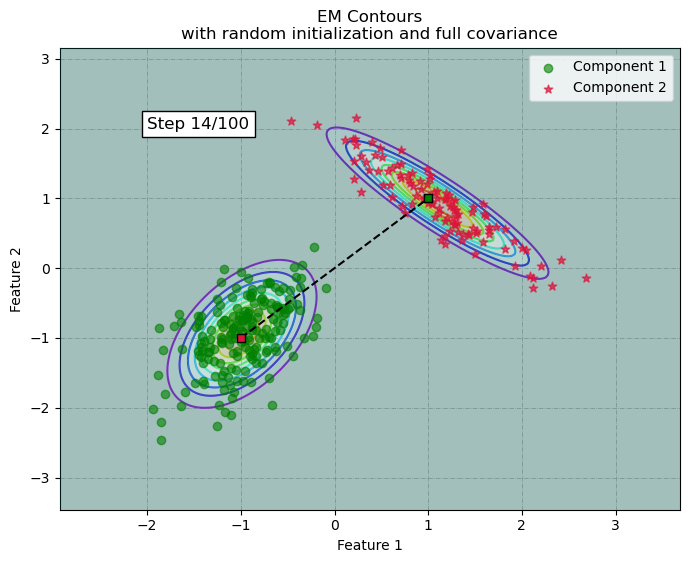



Full covariance | Random Initialization | Step no: 15  | Log-Likelihood value = -465.5787




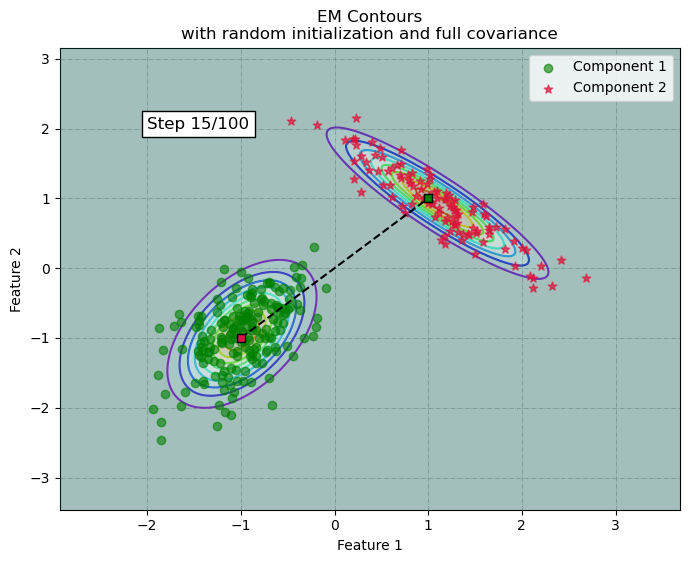



Full covariance | Random Initialization | Step no: 16  | Log-Likelihood value = -465.5787




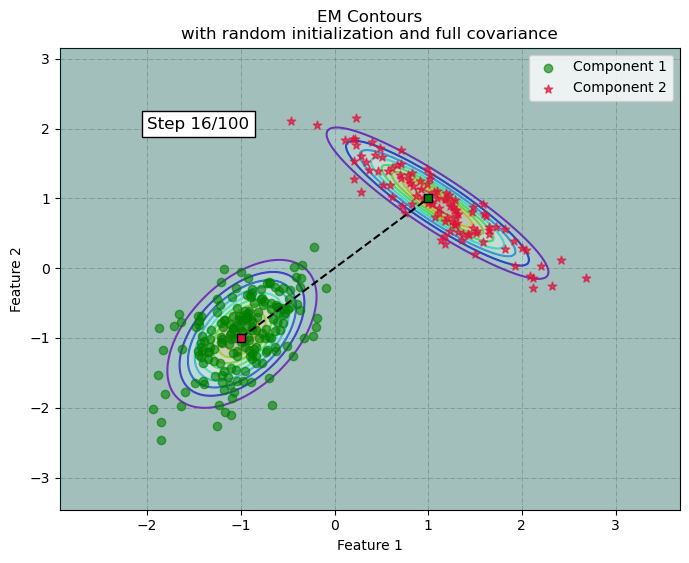



Full covariance | Random Initialization | Step no: 17  | Log-Likelihood value = -465.5787




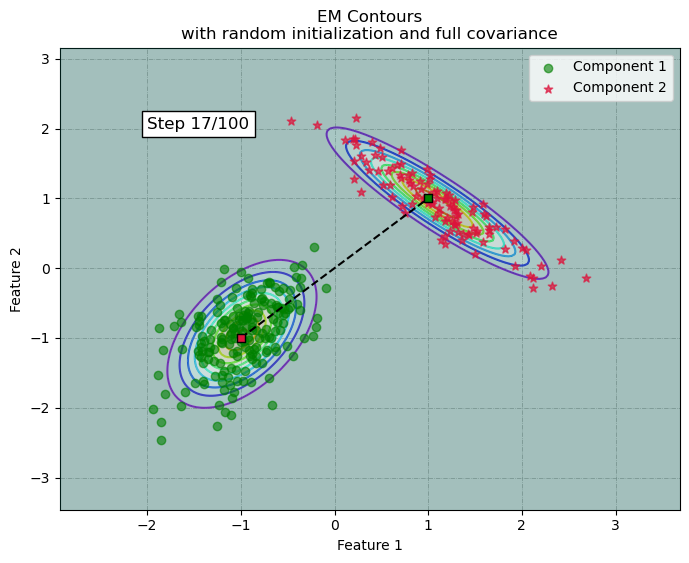



Full covariance | Random Initialization | Step no: 18  | Log-Likelihood value = -465.5787


Converged


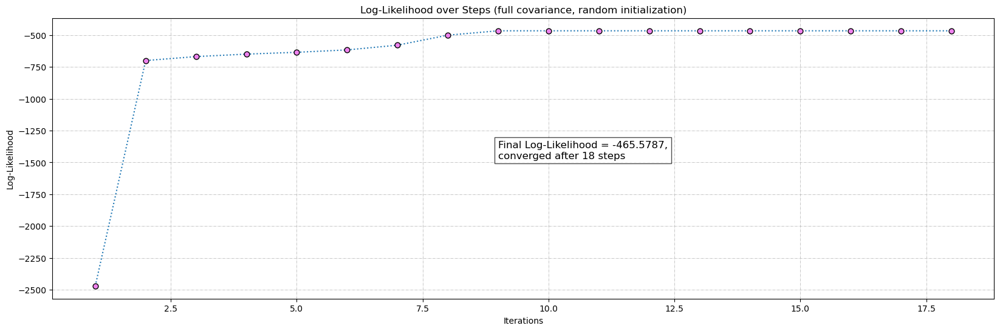



Full covariance | Fixed Initialization | Step no: 1  | Log-Likelihood value = -470.5844




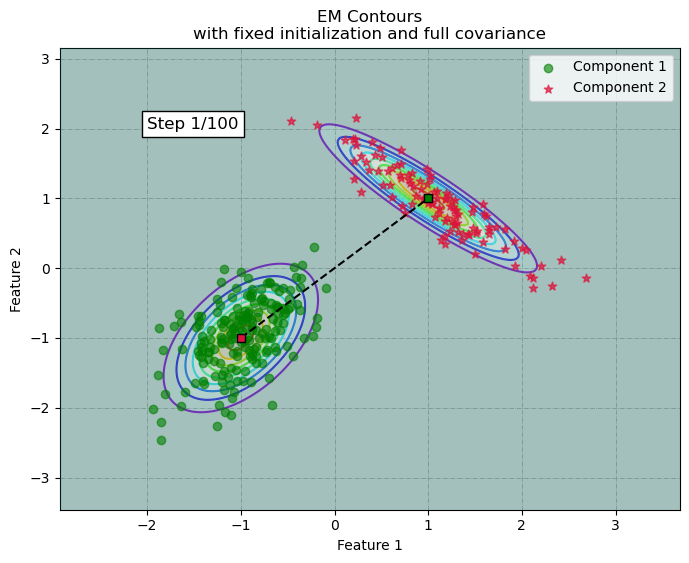



Full covariance | Fixed Initialization | Step no: 2  | Log-Likelihood value = -465.5787




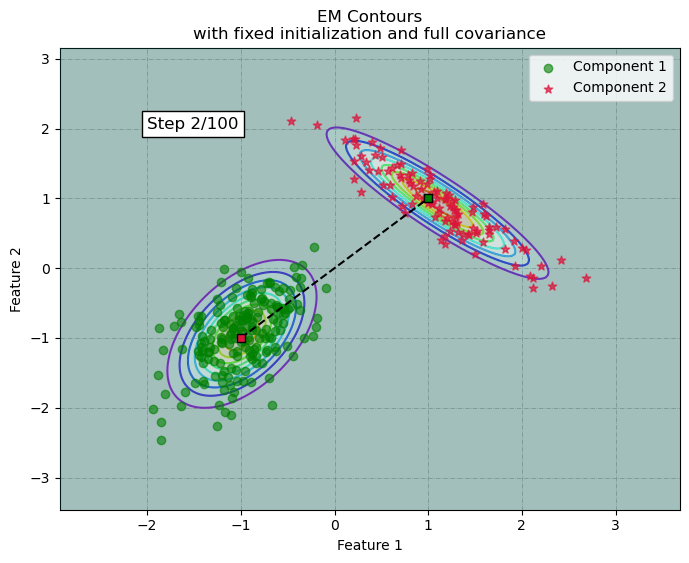



Full covariance | Fixed Initialization | Step no: 3  | Log-Likelihood value = -465.5787




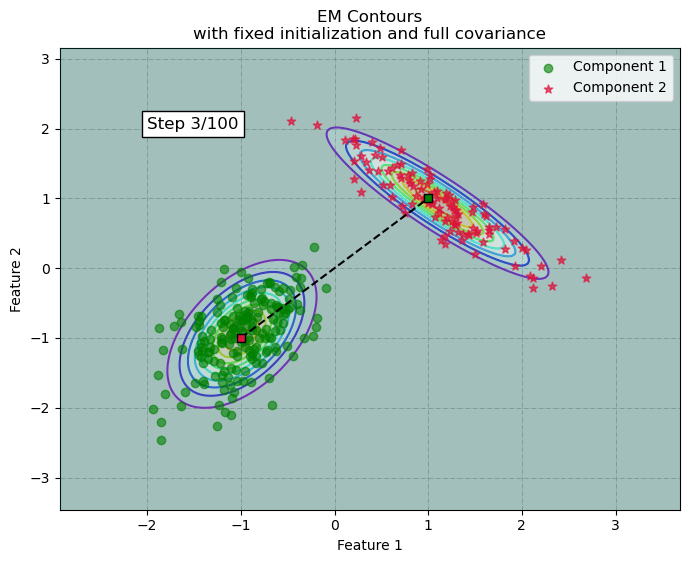



Full covariance | Fixed Initialization | Step no: 4  | Log-Likelihood value = -465.5787




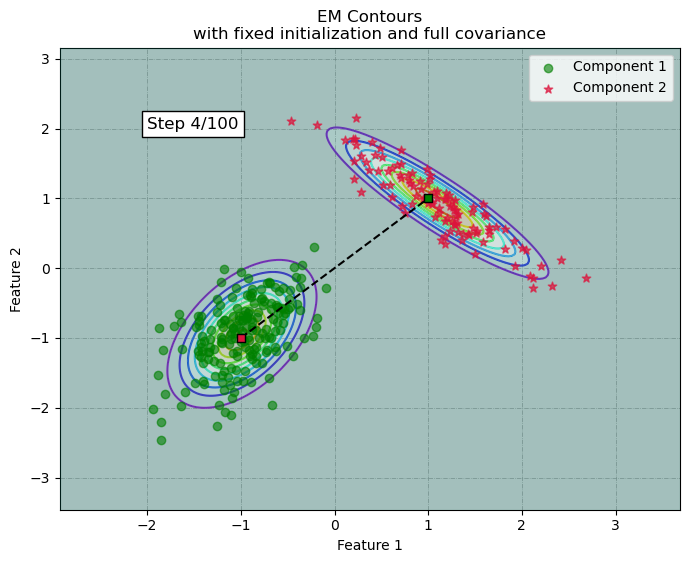



Full covariance | Fixed Initialization | Step no: 5  | Log-Likelihood value = -465.5787




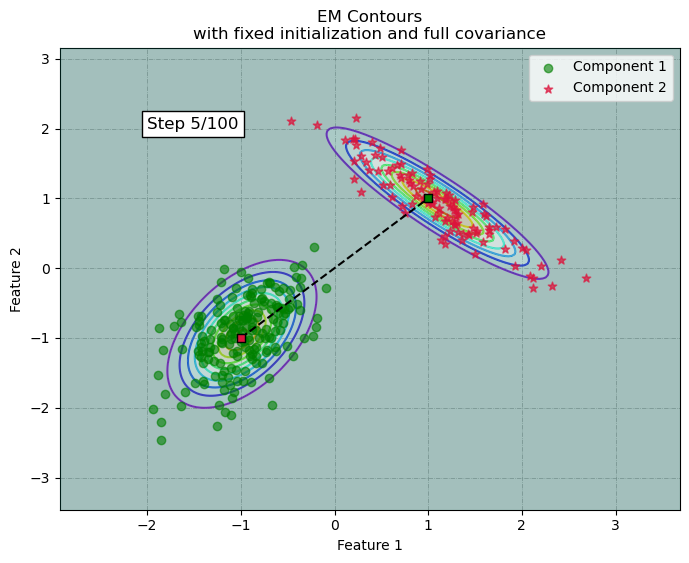



Full covariance | Fixed Initialization | Step no: 6  | Log-Likelihood value = -465.5787




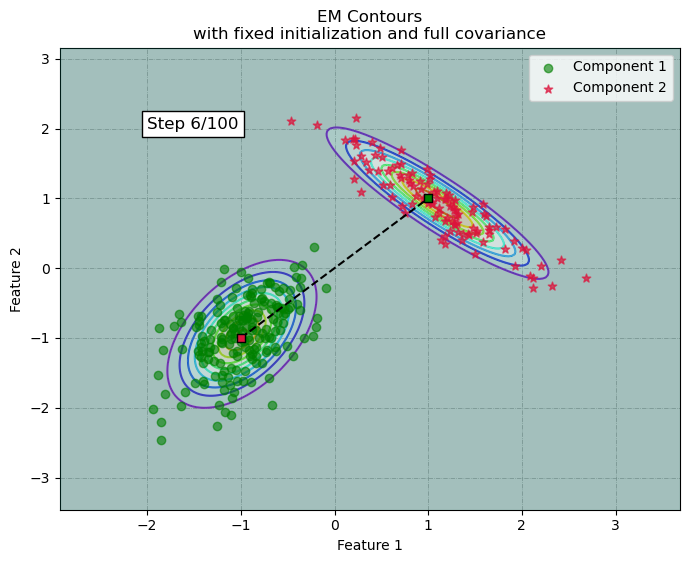



Full covariance | Fixed Initialization | Step no: 7  | Log-Likelihood value = -465.5787




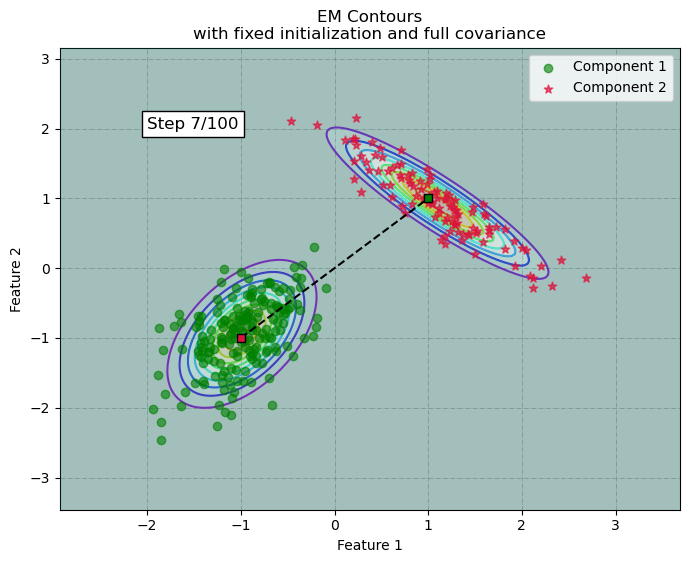



Full covariance | Fixed Initialization | Step no: 8  | Log-Likelihood value = -465.5787




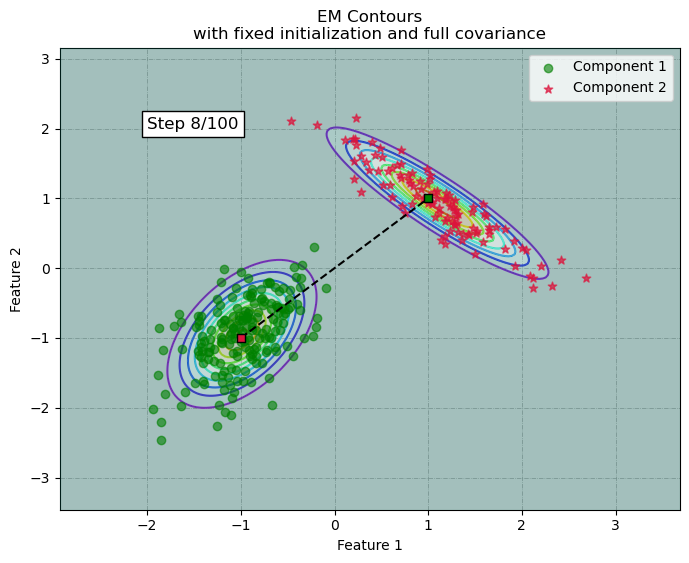



Full covariance | Fixed Initialization | Step no: 9  | Log-Likelihood value = -465.5787




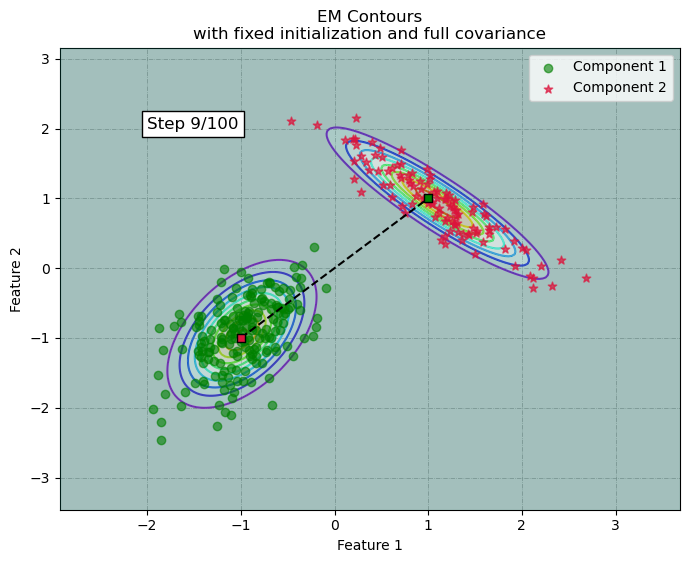



Full covariance | Fixed Initialization | Step no: 10  | Log-Likelihood value = -465.5787


Converged


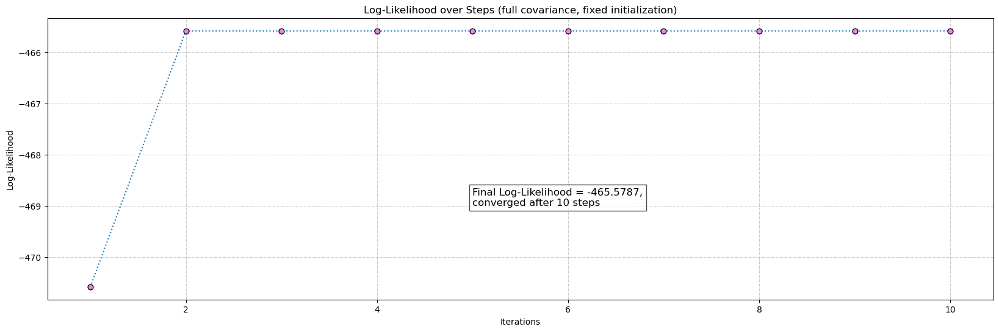



Spherical covariance | Random Initialization | Step no: 1  | Log-Likelihood value = -5230.8304




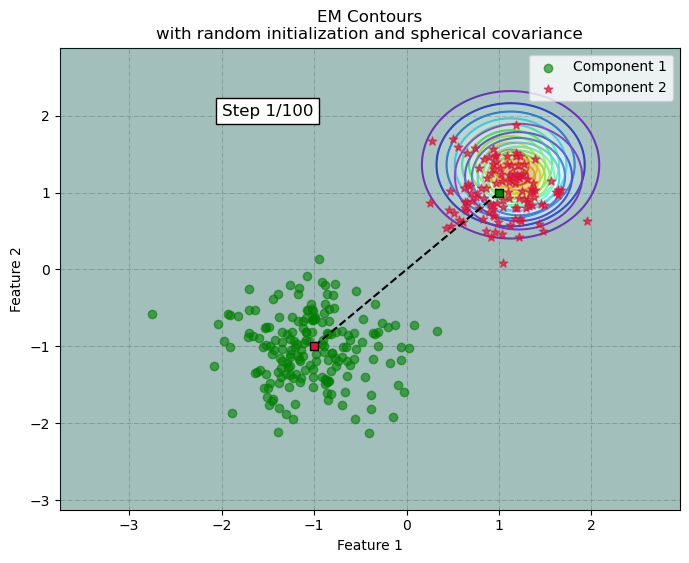



Spherical covariance | Random Initialization | Step no: 2  | Log-Likelihood value = -680.8342




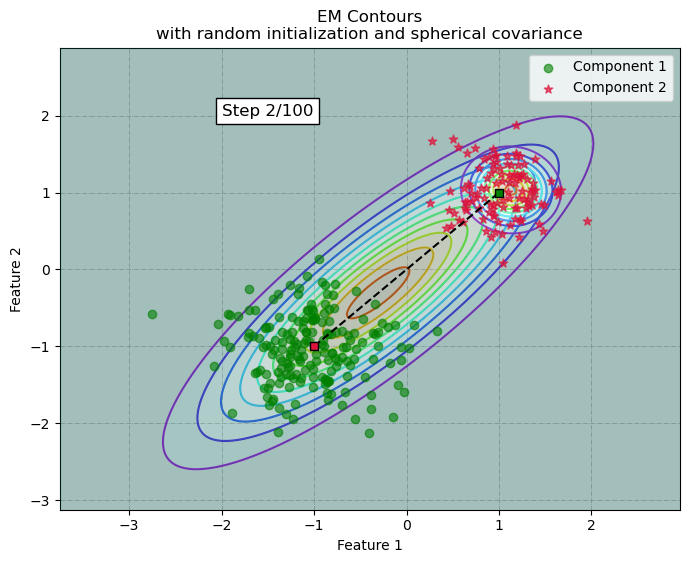



Spherical covariance | Random Initialization | Step no: 3  | Log-Likelihood value = -653.7588




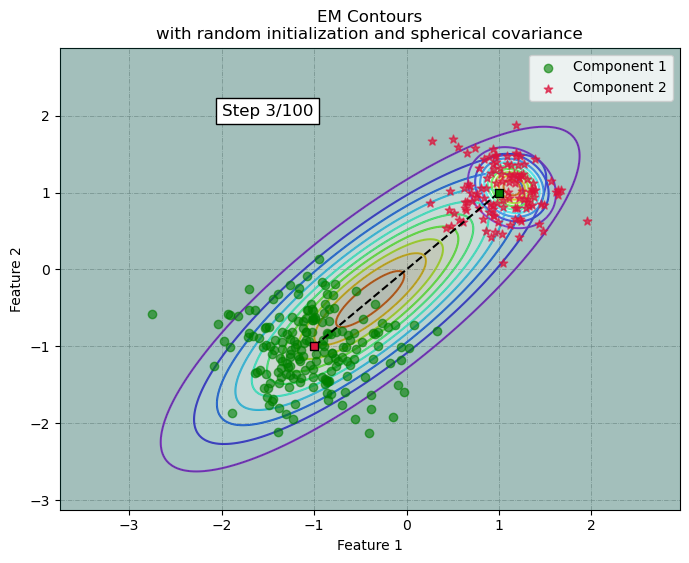



Spherical covariance | Random Initialization | Step no: 4  | Log-Likelihood value = -627.3228




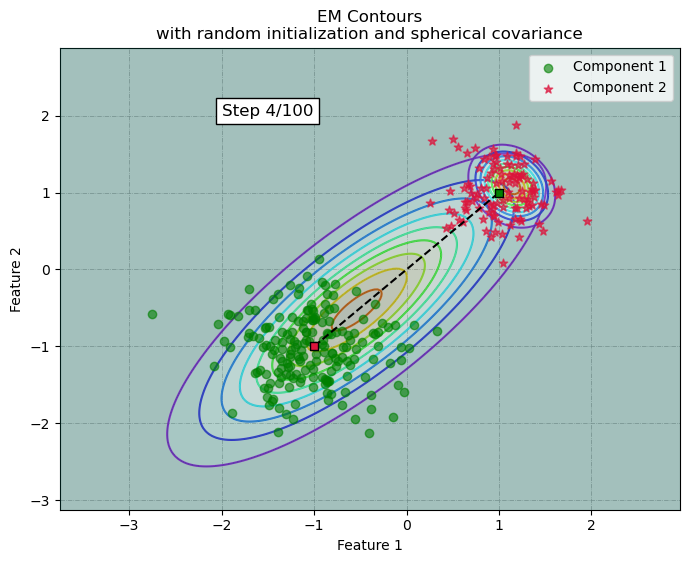



Spherical covariance | Random Initialization | Step no: 5  | Log-Likelihood value = -605.4796




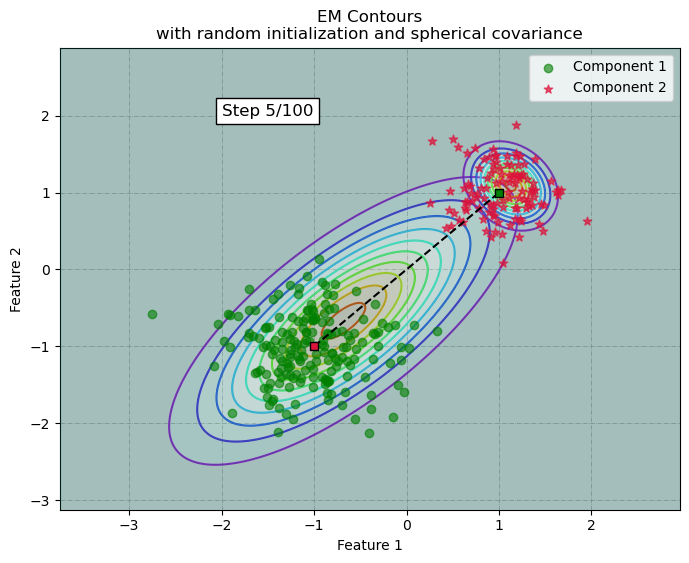



Spherical covariance | Random Initialization | Step no: 6  | Log-Likelihood value = -578.7503




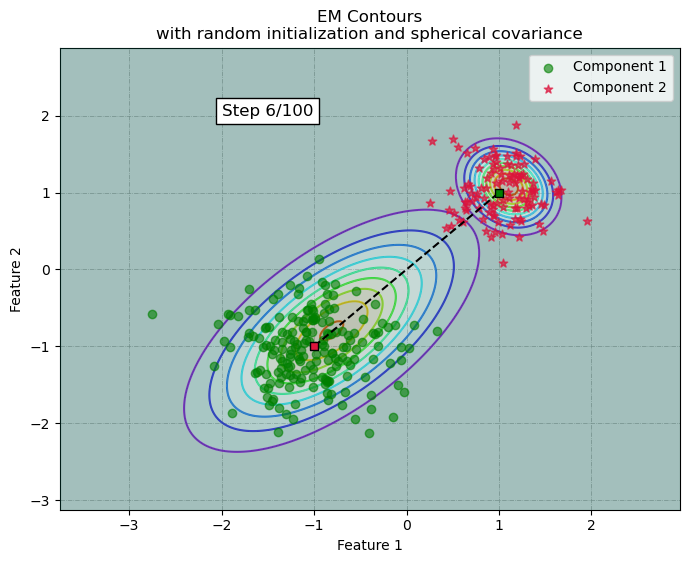



Spherical covariance | Random Initialization | Step no: 7  | Log-Likelihood value = -538.7171




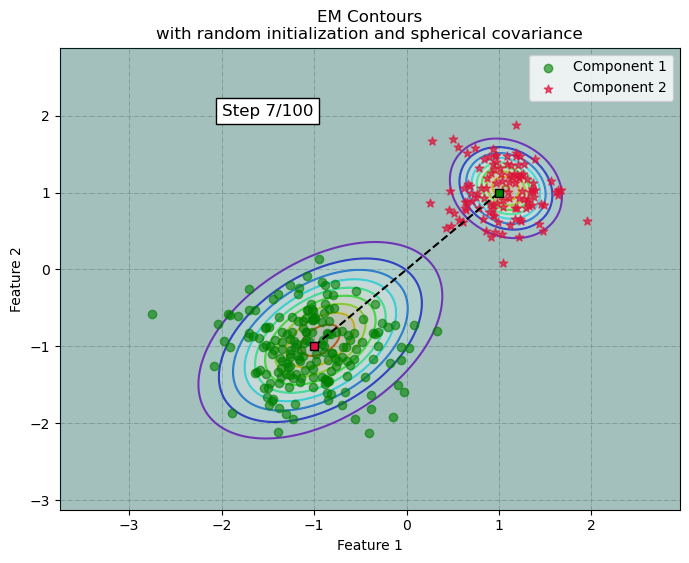



Spherical covariance | Random Initialization | Step no: 8  | Log-Likelihood value = -499.0581




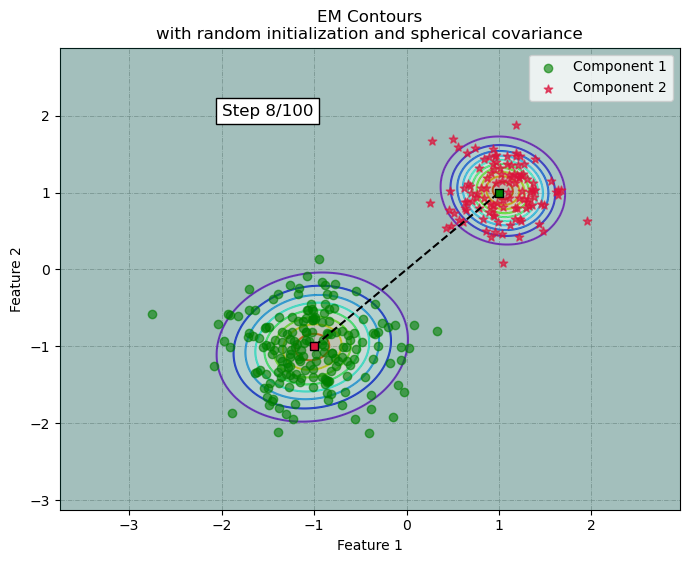



Spherical covariance | Random Initialization | Step no: 9  | Log-Likelihood value = -495.0771




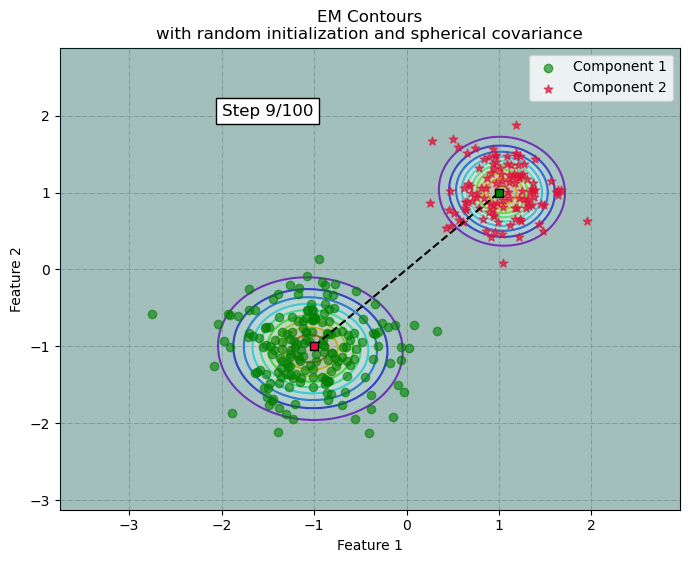



Spherical covariance | Random Initialization | Step no: 10  | Log-Likelihood value = -495.0771




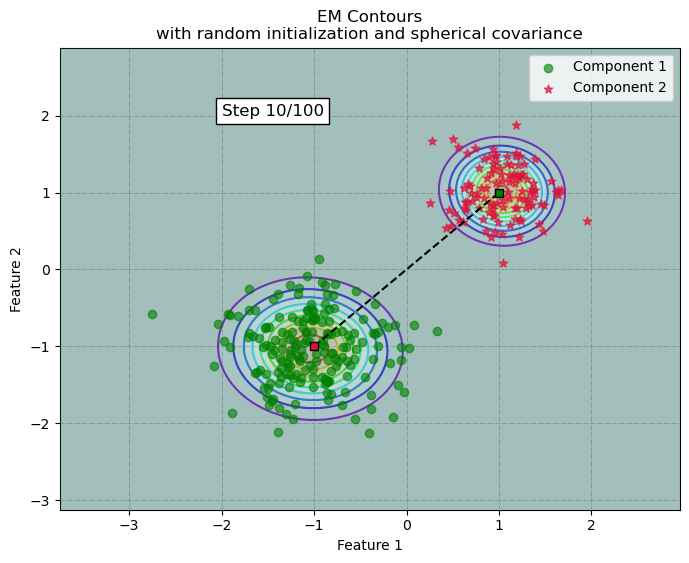



Spherical covariance | Random Initialization | Step no: 11  | Log-Likelihood value = -495.0771




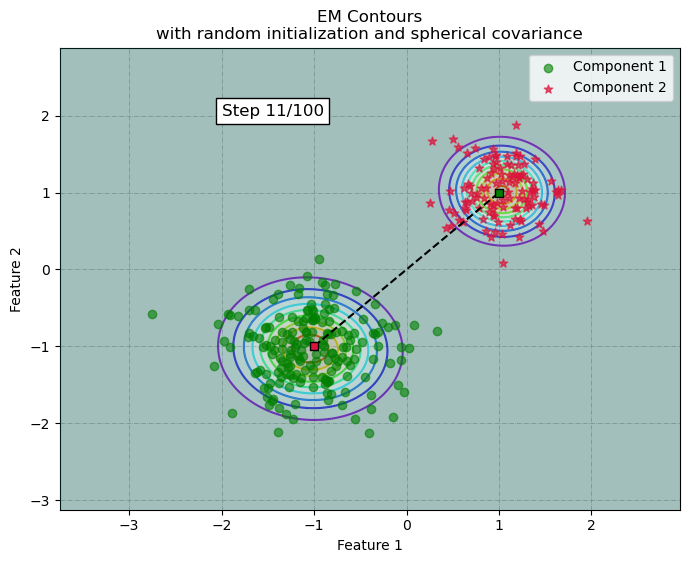



Spherical covariance | Random Initialization | Step no: 12  | Log-Likelihood value = -495.0771




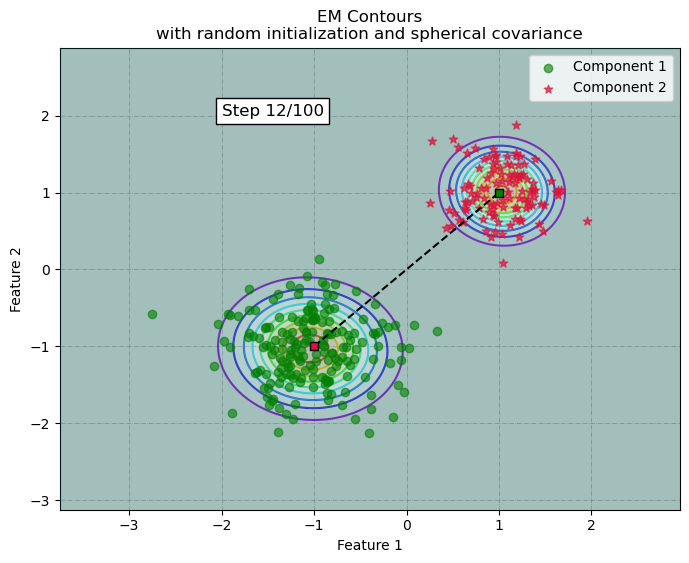



Spherical covariance | Random Initialization | Step no: 13  | Log-Likelihood value = -495.0771




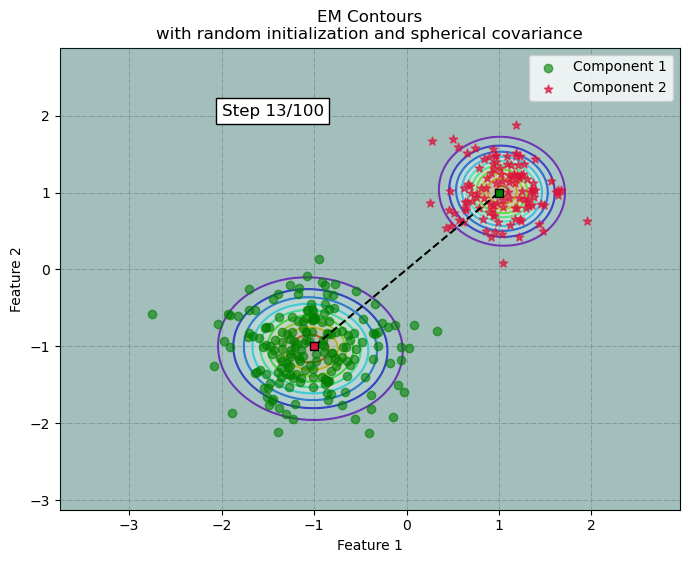



Spherical covariance | Random Initialization | Step no: 14  | Log-Likelihood value = -495.0771




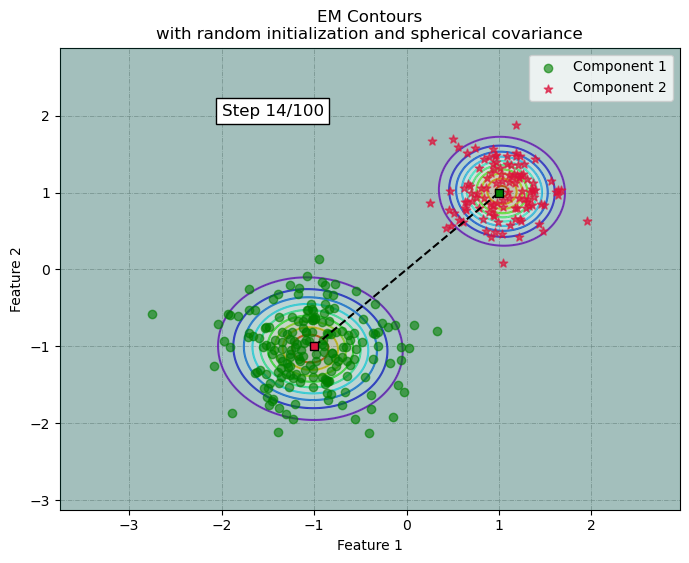



Spherical covariance | Random Initialization | Step no: 15  | Log-Likelihood value = -495.0771


Converged


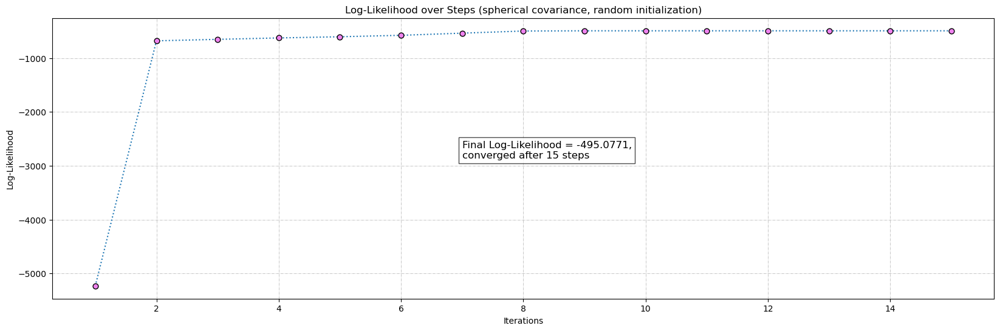



Spherical covariance | Fixed Initialization | Step no: 1  | Log-Likelihood value = -498.2303




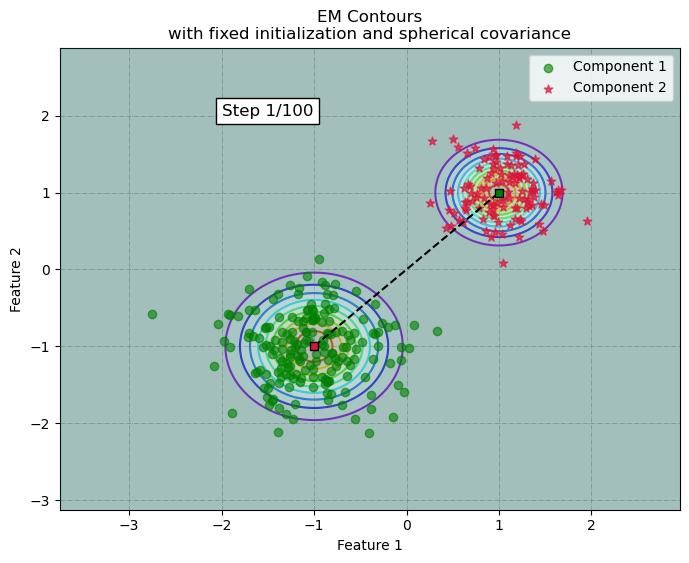



Spherical covariance | Fixed Initialization | Step no: 2  | Log-Likelihood value = -495.0771




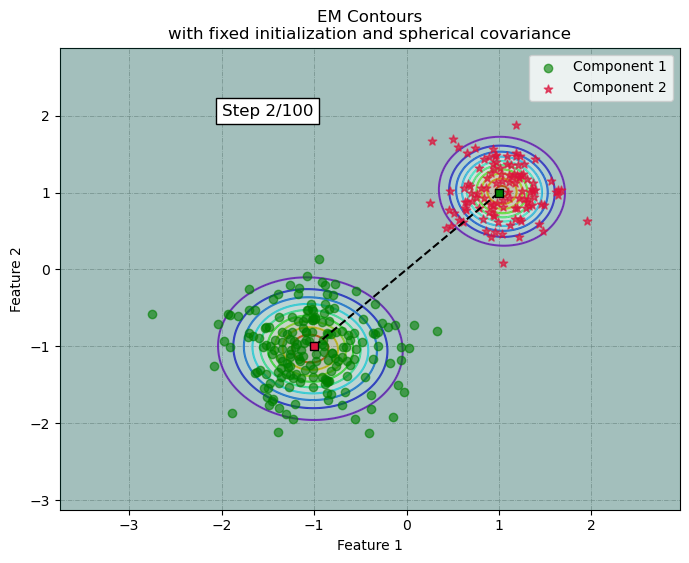



Spherical covariance | Fixed Initialization | Step no: 3  | Log-Likelihood value = -495.0771




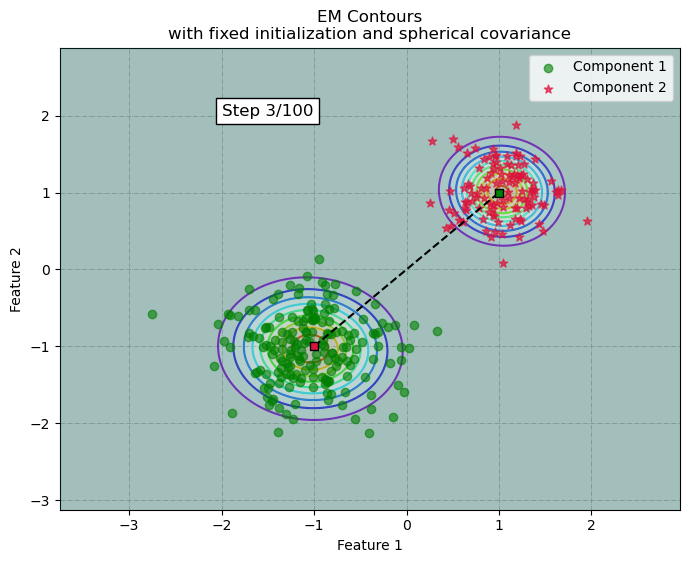



Spherical covariance | Fixed Initialization | Step no: 4  | Log-Likelihood value = -495.0771




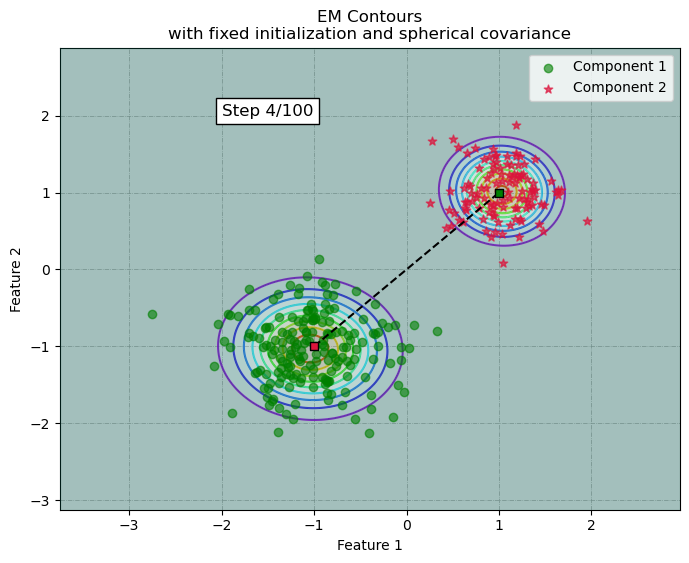



Spherical covariance | Fixed Initialization | Step no: 5  | Log-Likelihood value = -495.0771




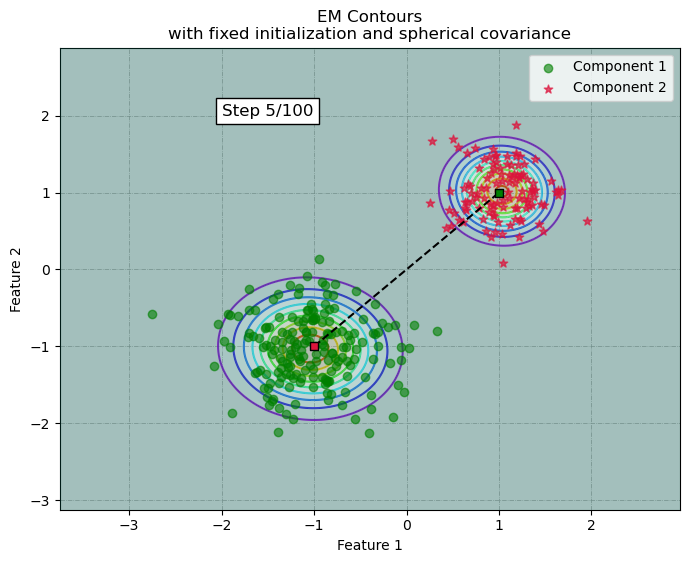



Spherical covariance | Fixed Initialization | Step no: 6  | Log-Likelihood value = -495.0771




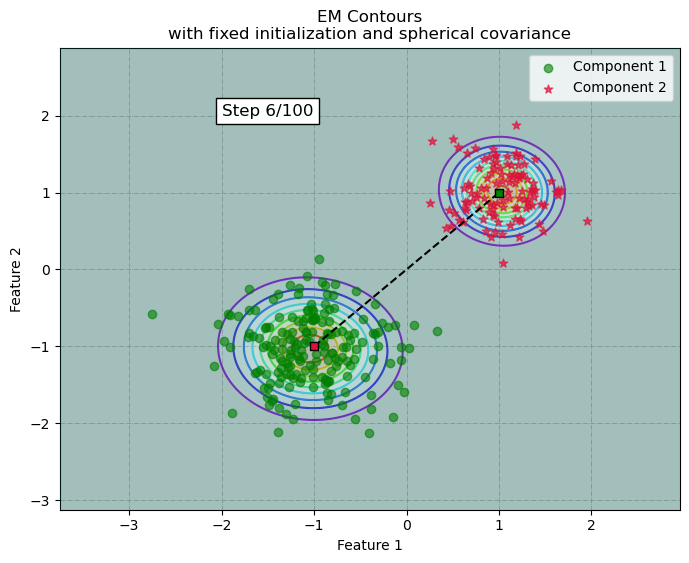



Spherical covariance | Fixed Initialization | Step no: 7  | Log-Likelihood value = -495.0771


Converged


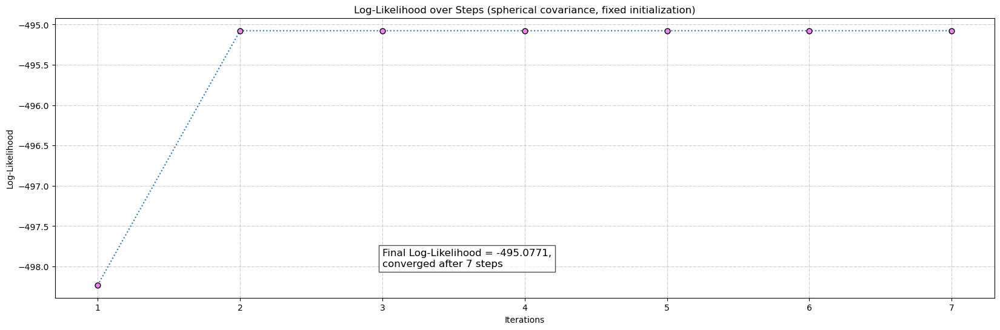



Diagonal covariance | Random Initialization | Step no: 1  | Log-Likelihood value = -820.1421




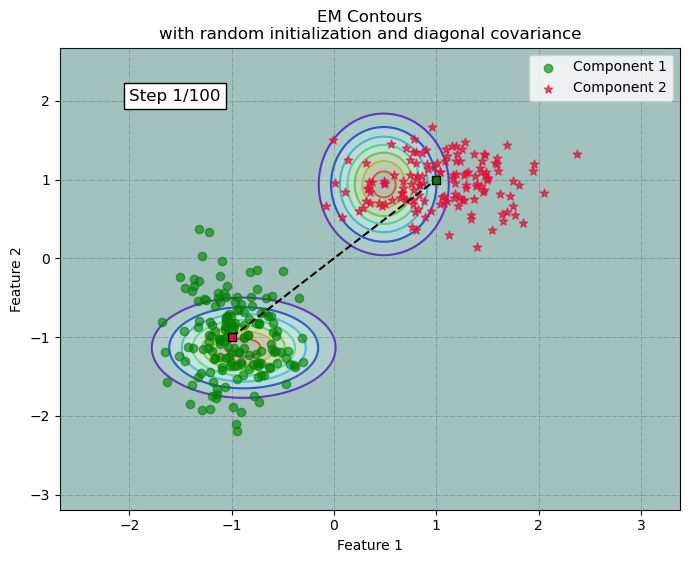



Diagonal covariance | Random Initialization | Step no: 2  | Log-Likelihood value = -458.7562




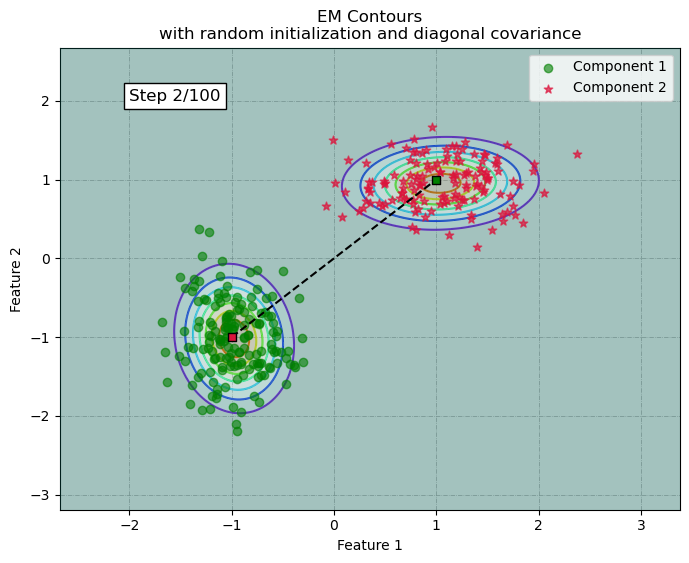



Diagonal covariance | Random Initialization | Step no: 3  | Log-Likelihood value = -458.7553




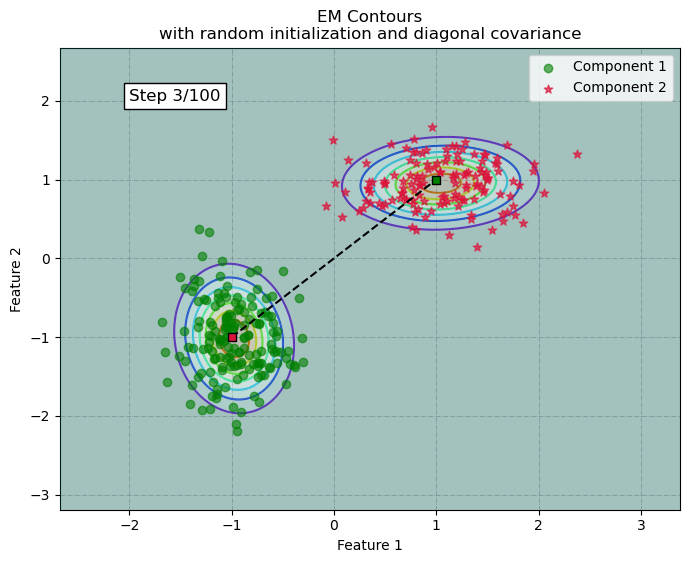



Diagonal covariance | Random Initialization | Step no: 4  | Log-Likelihood value = -458.7553




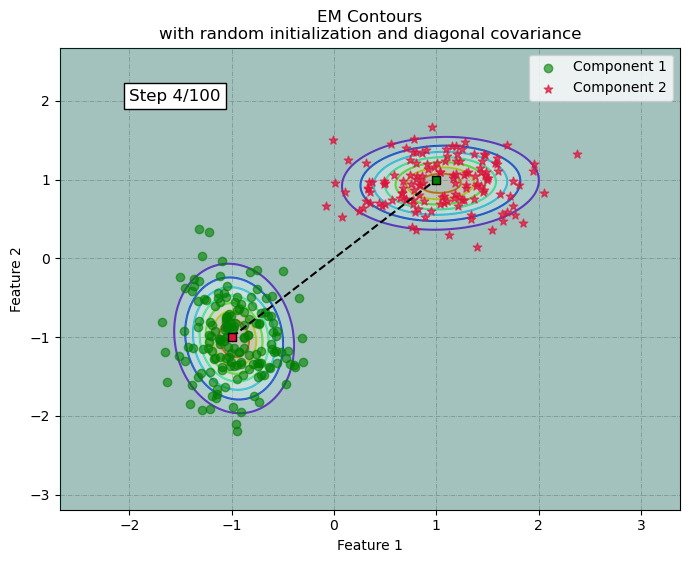



Diagonal covariance | Random Initialization | Step no: 5  | Log-Likelihood value = -458.7553




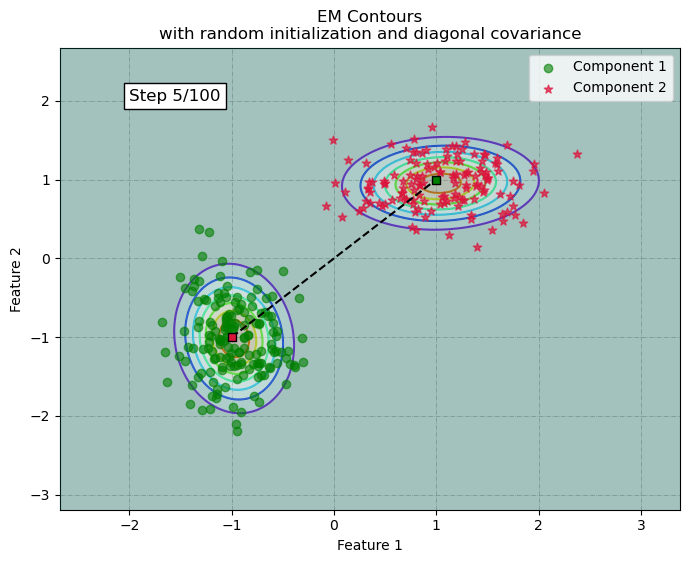



Diagonal covariance | Random Initialization | Step no: 6  | Log-Likelihood value = -458.7553




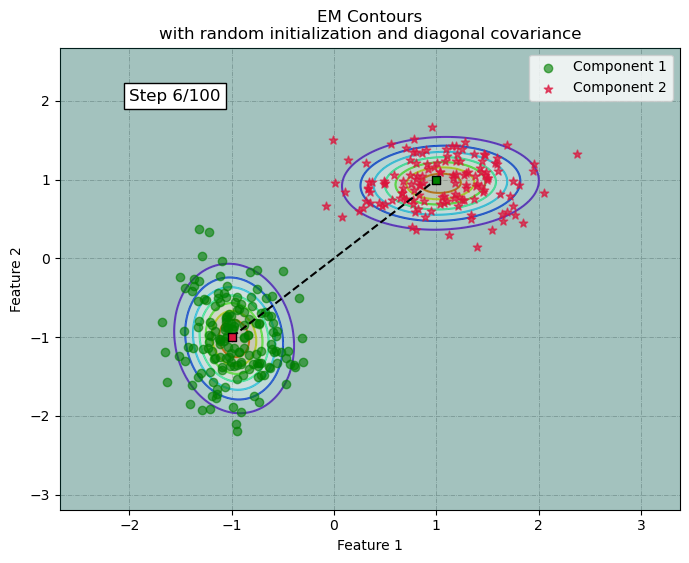



Diagonal covariance | Random Initialization | Step no: 7  | Log-Likelihood value = -458.7553




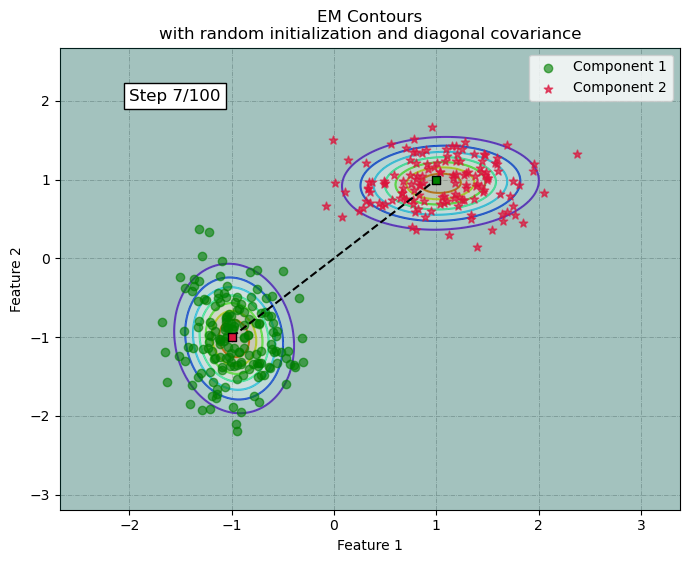



Diagonal covariance | Random Initialization | Step no: 8  | Log-Likelihood value = -458.7553




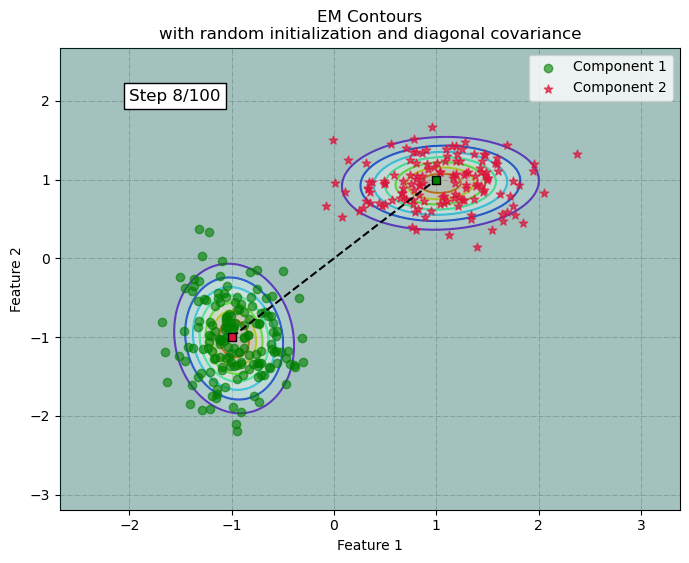



Diagonal covariance | Random Initialization | Step no: 9  | Log-Likelihood value = -458.7553


Converged


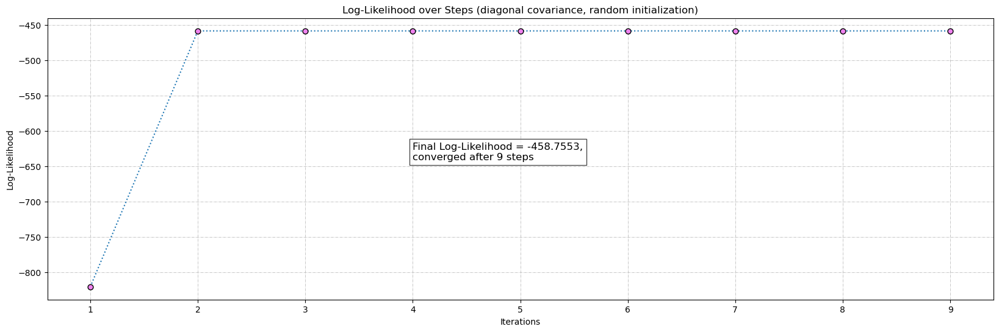



Diagonal covariance | Fixed Initialization | Step no: 1  | Log-Likelihood value = -467.8108




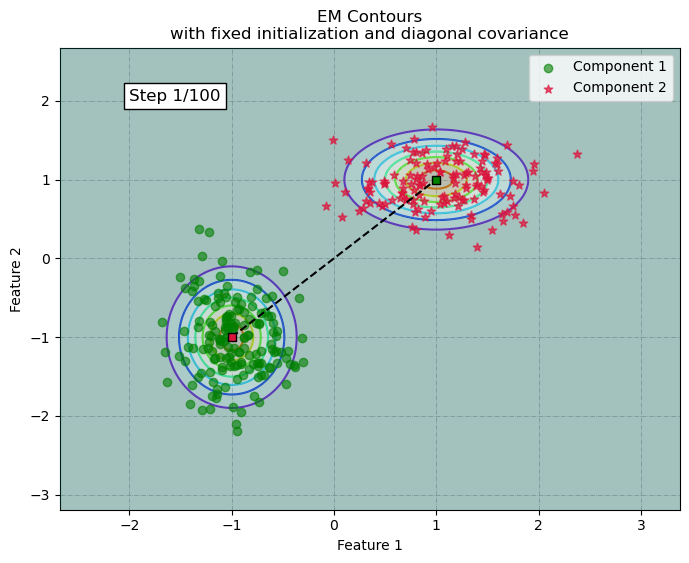



Diagonal covariance | Fixed Initialization | Step no: 2  | Log-Likelihood value = -458.7553




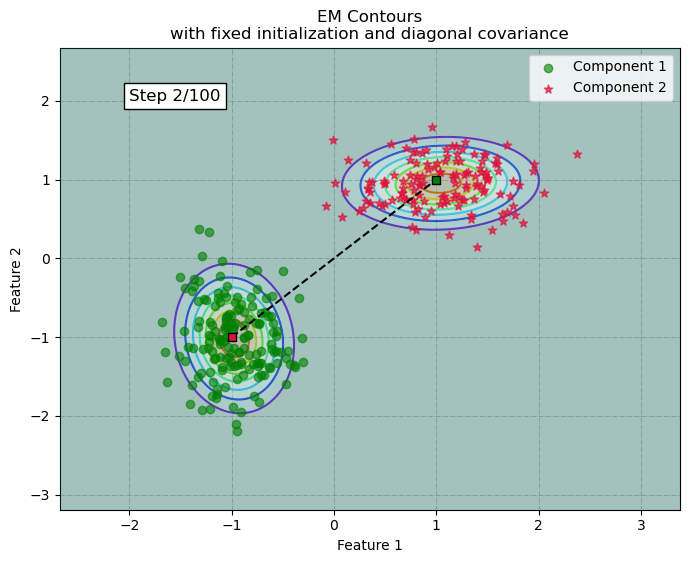



Diagonal covariance | Fixed Initialization | Step no: 3  | Log-Likelihood value = -458.7553




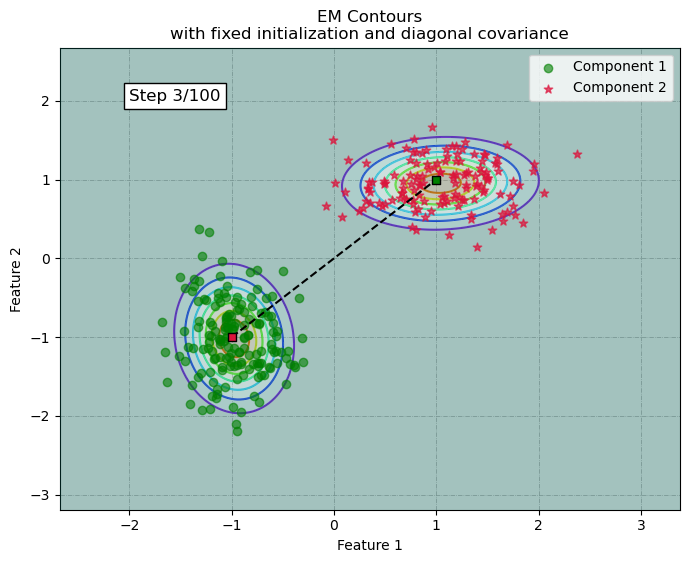



Diagonal covariance | Fixed Initialization | Step no: 4  | Log-Likelihood value = -458.7553




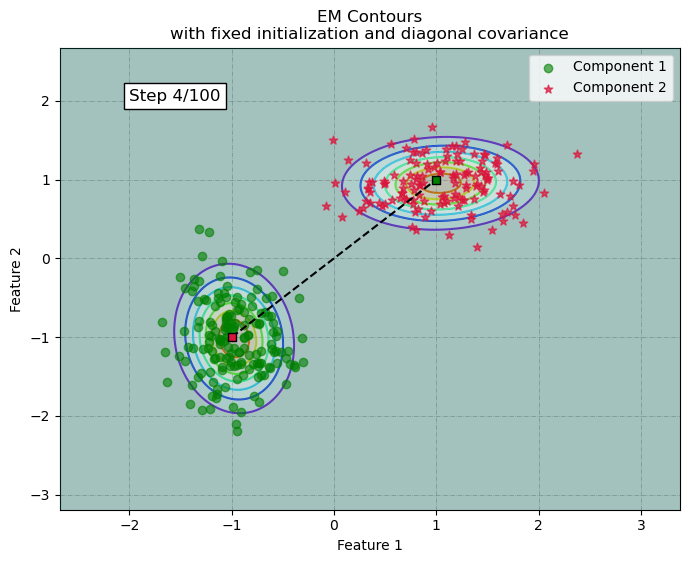



Diagonal covariance | Fixed Initialization | Step no: 5  | Log-Likelihood value = -458.7553




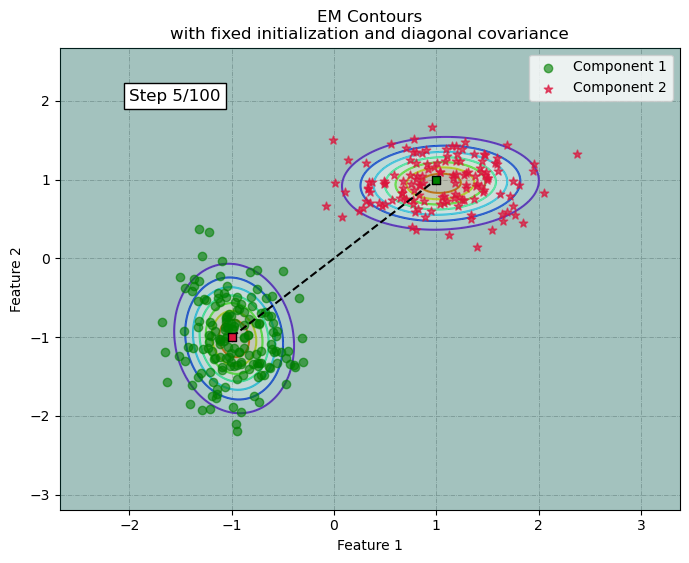



Diagonal covariance | Fixed Initialization | Step no: 6  | Log-Likelihood value = -458.7553




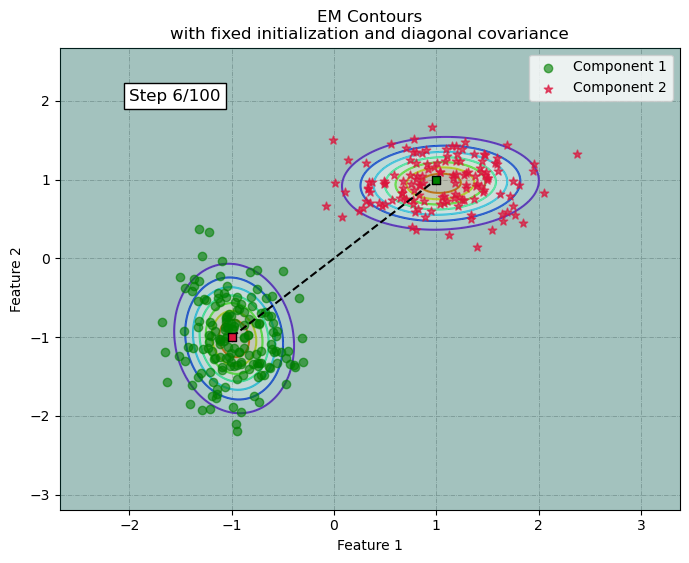



Diagonal covariance | Fixed Initialization | Step no: 7  | Log-Likelihood value = -458.7553




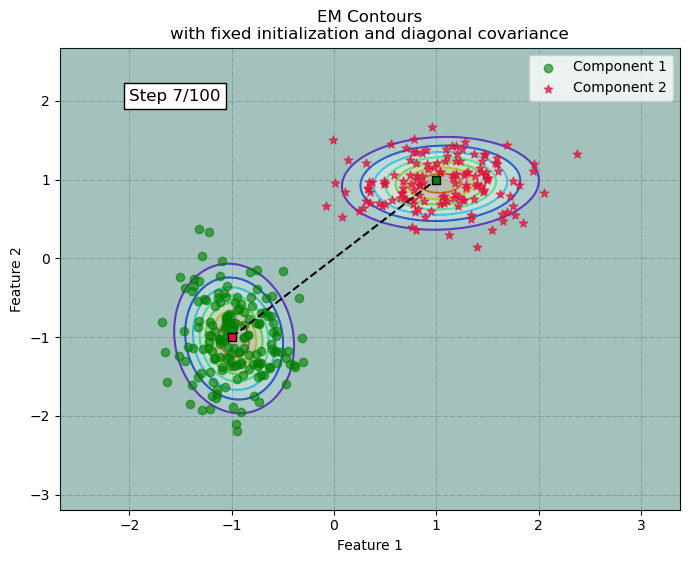



Diagonal covariance | Fixed Initialization | Step no: 8  | Log-Likelihood value = -458.7553


Converged


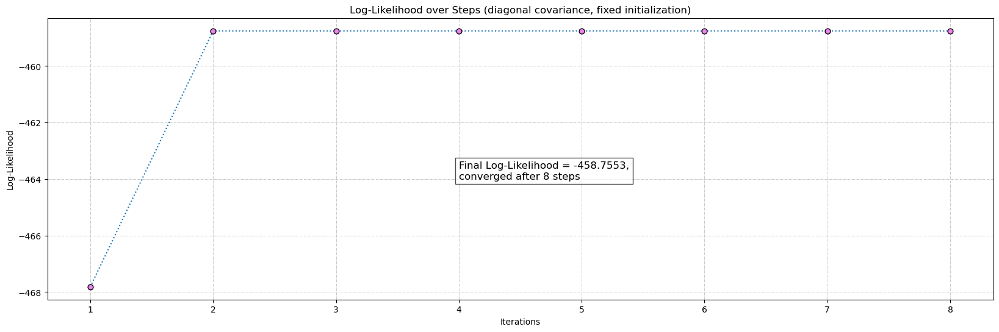

In [ ]:
############################################################################
##Part-6)-d: Understand the issues with EM algorithm
############################################################################

datasets = {
    "full": (data_full, labels_full),
    "spherical": (data_sp, labels_sp),
    "diagonal": (data_dg, labels_dg),
}

for cov_type, (dataset, label) in datasets.items():
    execute_em_algorithm(dataset, label, initialization_type="random", covariance_type=cov_type, steps=100)
    execute_em_algorithm(dataset, label, initialization_type="fixed", covariance_type=cov_type, steps=100)


**Report your observations**  
$\;\;\;$  
The plots have been divided into 6 cases [**initialization type** $\in$ {"fixed", "random"},**covariance type** $\in$ {"full", "spherical", "diagonal"} ]
1. The cases where the initialization occurs @ _random_ (with $\pi_{k}$'s to be randomly taken from dirichlet distribution), the log-likelihood converges in finite steps , it was observed that in many cases, there is a sharp peak in the graph of likelihood vs. iterations .this could be because , the mean vectors that are being chosen from the data randomly for both components could possibly because of the chance that they have been selected from same component. then one mean holds onto one component and the other mean has to travel from one component to the other one in-order to increase it's (likelihood)(or increase $\gamma_{nk}$'s of the other component. thus , this case takes more iterations to converge(half the iterations are eaten by the travelling of this other mean to it's respective component)

2. In the different case, if the means are selected from different component.   
In this case, the number of iterations are arround half(in many cases) to that of the previous case , thus converging in finite steps but might be more number of iterations or less number of iterations(when compared to _fixed_ initialization) depending on the randomization of the means and $\pi_{k}$'s

3. On the other hand, if the initialization occurs @ _fixed_ (with the values given in problem statement), the log-likelihood always has been a non-decreasing curve. and the sudden peak in the likelihood graph(although persists) isn't so drastic peak.


